# process spectra for AuxTel with new spectractor (version=2.3, December 2022, branch  auxtel_fit_PT) for particular config for Hologram

- author : Sylvie Dagoret-Campagne
- affiliation : IJCLab/IN2P3/CNES, DESC-LSST fullmember, behalf AuxTel Teal VERA C. Rubin observatory
- creation date : December 8th 2022
- update : 2022-12-08 (works with new kernel)

- version v3 : Work with exposure butlen gen3

This notebook is to help for finding the position of order 0

CCIN2P3:

- works with the new kernel **anaconda3_py39_auxtel** (with libradtran) 



# Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
print(sys.path)

['/pbs/throng/lsst/users/dagoret/desc/AuxTelComm/notebookccdm_gen3/runspectractor_standalone/2022_12', '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python39.zip', '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9', '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/lib-dynload', '', '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages', '__editable__.rubin_sim-0.13.1.finder.__path_hook__', '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/Spectractor-2.3-py3.9.egg', '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/libradtranpy-0.1.0-py3.9.egg', '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/Django-4.1.3-py3.9.egg', '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/sqlparse-0.4.3-py3.9.egg', '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/

In [3]:
all_paths_to_remove = ['/opt/conda/lib/python3.8/site-packages','/pbs/home/d/dagoret/.local/lib/python3.8/site-packages']

for path_to_remove in all_paths_to_remove:
    if path_to_remove in sys.path:
        print(f"remove {path_to_remove} from sys.path")
        sys.path.remove(path_to_remove)

In [4]:
sys.path

['/pbs/throng/lsst/users/dagoret/desc/AuxTelComm/notebookccdm_gen3/runspectractor_standalone/2022_12',
 '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python39.zip',
 '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9',
 '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/lib-dynload',
 '',
 '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages',
 '__editable__.rubin_sim-0.13.1.finder.__path_hook__',
 '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/Spectractor-2.3-py3.9.egg',
 '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/libradtranpy-0.1.0-py3.9.egg',
 '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/Django-4.1.3-py3.9.egg',
 '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/sqlparse-0.4.3-py3.9.egg',
 '/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/sit

In [5]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from matplotlib import  transforms
import pandas as pd

import matplotlib.ticker                         # here's where the formatter is
import os
import re

plt.rcParams["figure.figsize"] = (12,12)
plt.rcParams["axes.labelsize"] = 'xx-large'
plt.rcParams['axes.titlesize'] = 'xx-large'
plt.rcParams['xtick.labelsize']= 'xx-large'
plt.rcParams['ytick.labelsize']= 'xx-large'

In [6]:
print(sys.executable)
print(sys.version)
#print(sys.version_info)

/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/bin/python
3.9.13 (main, Aug 25 2022, 23:26:10) 
[GCC 11.2.0]


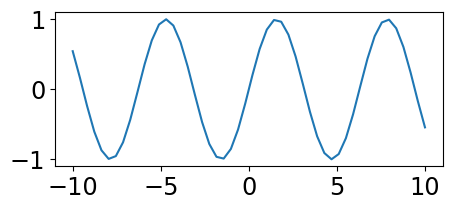

In [7]:
fig=plt.figure(figsize=(5,2))
ax=fig.add_subplot(1,1,1)
X=np.linspace(-10,10,50)
Y=np.sin(X)
ax.plot(X,Y)
plt.show()               


In [8]:
from iminuit import Minuit
import iminuit

In [9]:
iminuit.__version__

'2.17.0'

In [10]:
import scipy
print(scipy.__version__)

1.9.1


In [11]:
from astropy.io import fits
from astropy.coordinates import Angle
from astropy import units as u
from spectractor import parameters
from spectractor.extractor.extractor import Spectractor,dumpParameters,dumpfitparameters
from spectractor.extractor.images import *
from spectractor.config import load_config, set_logger
from scipy import ndimage, misc

In [12]:
import logging

In [13]:
from scipy.stats import kurtosis,skew
from scipy.stats import kurtosistest,skewtest,normaltest

In [14]:
from distutils.dir_util import copy_tree
import shutil

In [15]:
from astroquery.simbad import Simbad
import astroquery
astroquery.__version__
#result_table = Simbad.query_object("M1")

'0.4.6'

In [16]:
def find_target_name(tag):
    try:
        target_name=tag
        result_table = Simbad.query_object(target_name)
        return target_name
    except:
        target_name_stripped = ''.join(tag.split())
        result_table = Simbad.query_object(target_name_stripped)
        return target_name_stripped 
           

# Configuration

## Logger

In [17]:
my_logger = logging

## Config for the notebook

In [18]:
version="v6.0"  # version for taking images from data/2023 (images come from usdf)
# create output directories if not exist and clean existing files
FLAG_MANAGE_OUTPUT_SPECTRACTOR=True
# allow to run reconstruction with Spectractor
FLAG_GO_FOR_RECONSTRUCTION_WTH_SPECTRACTOR=True
FLAG_RUNWITHEXCEPTIONS = False

## Configuration for Spectractor

In [19]:
print("List of configuration files available : ",os.listdir("config"))

List of configuration files available :  ['.ipynb_checkpoints', 'auxtel_config_holo_DECONVOLUTION_FFMREBIN2vDec2022.ini', 'auxtel_config_holo_DECONVOLUTION_FFMvDec2022.ini']


In [20]:
# Choose the config filename
list_of_spectractorconfigfiles= ['auxtel_config_holo_DECONVOLUTION_PSF1D.ini' ,
                                 'auxtel_config_holo_DECONVOLUTION_PSF2D.ini',
                                 'auxtel_config_holo_DECONVOLUTION_FFM.ini',
                                 'auxtel_config_holo_DECONVOLUTION_PSF2DFFM.ini',
                                 'auxtel_config_holo_DECONVOLUTION_REBIN2PSF1D.ini',
                                 'auxtel_config_holo_DECONVOLUTION_REBIN2FFM.ini',
                                 'auxtel_config_holo_DECONVOLUTION_REBIN2PSF1DFFM300650.ini',
                                 'auxtel_config_holo_DECONVOLUTION_REBIN2PSF2D.ini',
                                 'auxtel_config_holo_DECONVOLUTION_REBIN2PSF1DrotA.ini',
                                 'auxtel_config_holo_DECONVOLUTION_REBIN2PSF1DrotB.ini',
                                 'auxtel_config_holo_DECONVOLUTION_REBIN2PSF1DrotC.ini',
                                 'auxtel_config_holo_DECONVOLUTION_REBIN2PSF1DrotD.ini',
                                 'auxtel_config_holo_DECONVOLUTION_PSF1D_BG40.ini',
                                 'auxtel_config_holo_DECONVOLUTION_PSF1DTRUNC.ini',
                                 'auxtel_config_holo_DECONVOLUTION_REBIN2FFMvNov2022.ini',
                                 'auxtel_config_holo_DECONVOLUTION_PSF2DvNov2022.ini',
                                 'auxtel_config_holo_DECONVOLUTION_FFMREBIN2vDec2022.ini',
                                 'auxtel_config_holo_DECONVOLUTION_FFMvDec2022.ini']

config_idx = len(list_of_spectractorconfigfiles)-2
                                
configfilename= os.path.join("./config",list_of_spectractorconfigfiles[config_idx])
#configdir = (list_of_spectractorconfigfiles[config_idx].split("_")[-1]).split(".") [0]
configdir = "config_" + (list_of_spectractorconfigfiles[config_idx].split("auxtel_config_holo_")[-1]).split(".") [0]

In [21]:
configfilename

'./config/auxtel_config_holo_DECONVOLUTION_FFMREBIN2vDec2022.ini'

In [22]:
configdir

'config_DECONVOLUTION_FFMREBIN2vDec2022'

In [23]:
! pwd

/pbs/throng/lsst/users/dagoret/desc/AuxTelComm/notebookccdm_gen3/runspectractor_standalone/2022_12


In [24]:
config=configfilename
print(f">>>>> Spectractor configuration filename : {configfilename}")

>>>>> Spectractor configuration filename : ./config/auxtel_config_holo_DECONVOLUTION_FFMREBIN2vDec2022.ini


In [25]:
load_config(configfilename)

In [26]:
dumpParameters()

ASTROMETRYNET_DIR 
BGD_ORDER 1
CALIB_BGD_NPARAMS 4
CALIB_BGD_ORDER 3
CALIB_BGD_WIDTH 15
CALIB_PEAK_WIDTH 7
CALIB_SAVGOL_ORDER 2
CALIB_SAVGOL_WINDOW 5
CCD_ARCSEC2RADIANS 4.84813681109536e-06
CCD_GAIN 1.1
CCD_IMSIZE 2048
CCD_MAXADU 170000
CCD_PIXEL2ARCSEC 0.1904
CCD_PIXEL2MM 0.02
CCD_REBIN 2
CONFIG_DIR /sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/Spectractor-2.3-py3.9.egg/spectractor/../config/
DEBUG False
DEBUG_LOGGING False
DISPERSER_DIR /sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/Spectractor-2.3-py3.9.egg/spectractor/extractor/dispersers/
DISPLAY True
DISTANCE2CCD 181
DISTANCE2CCD_ERR 0.4
FGB37 {'label': 'FGB37', 'min': 350, 'max': 750}
FILTERS [{'label': 'RG715', 'min': 690, 'max': 1100}, {'label': 'FGB37', 'min': 350, 'max': 750}, {'label': 'Halfa', 'min': 0.0006431, 'max': 0.0006686999999999999}, {'label': 'Z-Gunn', 'min': 800, 'max': 1100}]
FLAM_TO_ADURATE 5175865186660.421
GRATING_ORDER_2OVER1 0.1
GROOVES_

# Exposure config

In [27]:
! ls logbooks

auxtellogbook_empty~holo4_003_20211103_v5.0.csv
auxtellogbook_empty~holo4_003_20211104_v5.0.csv
auxtellogbook_empty~holo4_003_20220316_v5.0.csv
auxtellogbook_empty~holo4_003_20220317_v5.0.csv
auxtellogbook_empty~holo4_003_20220607_v5.0.csv
auxtellogbook_empty~holo4_003_20220608_v5.0.csv
auxtellogbook_empty~holo4_003_20220609_v5.0.csv
auxtellogbook_empty~holo4_003_20220628_v5.0.csv
auxtellogbook_empty~holo4_003_20220629_v5.0.csv
auxtellogbook_empty~holo4_003_20220629_v5.0.csv~
auxtellogbook_empty~holo4_003_20220630_v5.0.csv
auxtellogbook_empty~holo4_003_20221207_v6.0.csv
auxtellogbook_empty~holo4_003_20221208_v6.0.csv
auxtellogbook_empty~holo4_003_20221208_v6.0.xlsx


In [28]:
# path index for each month
DATE="20221207"
#DATE="20211104"
filterdispersername = "empty~holo4_003"
#filterdispersername = "BG40~holo4_003"
#filterdispersername = "FELH0600~holo4_003"
imagemode = "postISRCCD"
#imagemode = "unflattened"

In [29]:
disperser_label = filterdispersername.split("~")[-1]

## Paths

In [30]:
# select if we run at CC or not (locally) 
# /sps/lsst/groups/auxtel/data/2022/holo/20220317
HOSTCC=True
LAPTOP=False

In [31]:
# Set path depending on which computer running (according HOSTCC)
if HOSTCC:
    path_auxtel="/sps/lsst/groups/auxtel"
    path_spectractor=os.path.join(path_auxtel,"softs/github/desc/Spectractor")
    path_spectractor_config=os.path.join(path_spectractor,"config")
    path_images=os.path.join(path_auxtel,"data/2023/"+filterdispersername+"/"+DATE)
    if configdir == "":
        path_output_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+DATE)
    else:
        path_output_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir+"/"+DATE)
        path_topoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir)
        path_toptopoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername)
        path_toptoptopoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode)

else:
    if not LAPTOP:
        path_auxtel="/Users/sylvie/DATA/AuxTelData2022"
        path_spectractor=os.path.join(path_auxtel,"/Users/sylvie/MacOSX/GitHub/LSST/Spectractor")
        path_spectractor_config=os.path.join(path_spectractor,"config")
        path_images=os.path.join(path_auxtel,"data/2023/"+filterdispersername+"/"+DATE)
        if configdir == "":
            path_output_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+DATE)
        else:
            path_output_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir+"/"+DATE)
            path_topoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir)
            path_toptopoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername)
            path_toptoptopoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode)
    else:
        path_auxtel="/Users/dagoret/DATA/AuxTelData2022"
        path_spectractor=os.path.join(path_auxtel,"/Users/dagoret/MacOSX/GitHub/LSST/Spectractor")
        path_spectractor_config=os.path.join(path_spectractor,"config")
        path_images=os.path.join(path_auxtel,"data/2023/"+filterdispersername+"/"+DATE)
        if configdir == "":
            path_output_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+DATE)
        else:
            path_output_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir+"/"+DATE)
            path_topoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir)
            path_toptopoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername)
            path_toptoptopoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode)
        


In [32]:
path_images

'/sps/lsst/groups/auxtel/data/2023/empty~holo4_003/20221207'

In [33]:
path_topoutput_spectractor

'/sps/lsst/groups/auxtel/data/2023/OutputSpectractor/postISRCCD/empty~holo4_003/config_DECONVOLUTION_FFMREBIN2vDec2022'

In [34]:
path_output_spectractor

'/sps/lsst/groups/auxtel/data/2023/OutputSpectractor/postISRCCD/empty~holo4_003/config_DECONVOLUTION_FFMREBIN2vDec2022/20221207'

# Utility Functions

In [35]:
def is_nan(x):
    return (x != x)

# Logbook for input file selection

- the logbook contains all input image path and possibily the order 0 position

In [36]:
!ls logbooks

auxtellogbook_empty~holo4_003_20211103_v5.0.csv
auxtellogbook_empty~holo4_003_20211104_v5.0.csv
auxtellogbook_empty~holo4_003_20220316_v5.0.csv
auxtellogbook_empty~holo4_003_20220317_v5.0.csv
auxtellogbook_empty~holo4_003_20220607_v5.0.csv
auxtellogbook_empty~holo4_003_20220608_v5.0.csv
auxtellogbook_empty~holo4_003_20220609_v5.0.csv
auxtellogbook_empty~holo4_003_20220628_v5.0.csv
auxtellogbook_empty~holo4_003_20220629_v5.0.csv
auxtellogbook_empty~holo4_003_20220629_v5.0.csv~
auxtellogbook_empty~holo4_003_20220630_v5.0.csv
auxtellogbook_empty~holo4_003_20221207_v6.0.csv
auxtellogbook_empty~holo4_003_20221208_v6.0.csv
auxtellogbook_empty~holo4_003_20221208_v6.0.xlsx


In [37]:
filename_logbook='logbooks/auxtellogbook_'+filterdispersername+"_"+DATE+'_' + version+'.csv'

In [38]:
filename_logbook

'logbooks/auxtellogbook_empty~holo4_003_20221207_v6.0.csv'

In [39]:
df=pd.read_csv(filename_logbook,index_col=0)

In [40]:
pd.set_option('display.max_rows', None)

In [41]:
# show the list of input files from the logbook to select the file index in the logbook
df

,index,date,path,file,num,object,filter,disperser,airmass,exposure,...,temperature,humidity,windspd,Obj-posXpix,Obj-posYpix,Dx,Dy,skip,run,quality
0,0,2022-12-08T04:21:39.848,/sps/lsst/groups/auxtel/data/2023/empty~holo4_...,exposure_2022120700357_postisrccd.fits,357,HD185975,empty_1,holo4_003,2.062400,30.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,NaN
1,1,2022-12-08T04:24:19.011,/sps/lsst/groups/auxtel/data/2023/empty~holo4_...,exposure_2022120700361_postisrccd.fits,361,HD074000,empty_1,holo4_003,1.728743,30.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,NaN
2,2,2022-12-08T04:25:01.980,/sps/lsst/groups/auxtel/data/2023/empty~holo4_...,exposure_2022120700362_postisrccd.fits,362,HD074000,empty_1,holo4_003,1.722192,30.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,NaN
3,3,2022-12-08T04:27:21.436,/sps/lsst/groups/auxtel/data/2023/empty~holo4_...,exposure_2022120700366_postisrccd.fits,366,HD60753,empty_1,holo4_003,1.241016,30.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,NaN
4,4,2022-12-08T04:28:04.366,/sps/lsst/groups/auxtel/data/2023/empty~holo4_...,exposure_2022120700367_postisrccd.fits,367,HD60753,empty_1,holo4_003,1.239308,30.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,NaN
5,5,2022-12-08T04:30:21.301,/sps/lsst/groups/auxtel/data/2023/empty~holo4_...,exposure_2022120700371_postisrccd.fits,371,HD074000,empty_1,holo4_003,1.675438,30.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,NaN
6,6,2022-12-08T04:31:04.229,/sps/lsst/groups/auxtel/data/2023/empty~holo4_...,exposure_2022120700372_postisrccd.fits,372,HD074000,empty_1,holo4_003,1.669413,30.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,NaN
7,7,2022-12-08T04:43:49.617,/sps/lsst/groups/auxtel/data/2023/empty~holo4_...,exposure_2022120700376_postisrccd.fits,376,HD074000,empty_1,holo4_003,1.570405,30.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,NaN
8,8,2022-12-08T04:44:32.479,/sps/lsst/groups/auxtel/data/2023/empty~holo4_...,exposure_2022120700377_postisrccd.fits,377,HD074000,empty_1,holo4_003,1.565322,30.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,NaN
9,9,2022-12-08T04:46:52.811,/sps/lsst/groups/auxtel/data/2023/empty~holo4_...,exposure_2022120700381_postisrccd.fits,381,HD60753,empty_1,holo4_003,1.198119,30.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,NaN


# Selection of input file
- the input file is selected from the logbook list above

In [42]:
idx=2

In [43]:
print(df.iloc[idx]['file'])

exposure_2022120700362_postisrccd.fits


In [44]:
print(df.iloc[idx])

index                                                          2
date                                     2022-12-08T04:25:01.980
path           /sps/lsst/groups/auxtel/data/2023/empty~holo4_...
file                      exposure_2022120700362_postisrccd.fits
num                                                          362
object                                                  HD074000
filter                                                   empty_1
disperser                                              holo4_003
airmass                                                 1.722192
exposure                                                    30.0
focus                                                   0.026534
seeing                                                       NaN
pressure                                                     NaN
temperature                                                  NaN
humidity                                                     NaN
windspd                  

In [45]:
myhome=os.getenv("HOME")

In [46]:
dir_images=path_images

In [47]:
dir_images

'/sps/lsst/groups/auxtel/data/2023/empty~holo4_003/20221207'

In [48]:
filename_image=df['file'][idx]
filename_image

'exposure_2022120700362_postisrccd.fits'

In [49]:
target = df['object'][idx]
target

'HD074000'

## If order 0 position exists in logbook it is selected, otherwise put it by hand

In [50]:
# ## If order 0 position exists in logbook it is selected, otherwise put it by hand

x0=300
y0=1700

if 'Obj-posXpix' in df.columns and 'Obj-posYpix' in df.columns:
    thex0 = df['Obj-posXpix'][idx]
    if not is_nan(thex0):
        x0=thex0
    they0 = df['Obj-posYpix'][idx]
    if not is_nan(they0):
        y0=they0
    
if not is_nan(x0) and not is_nan(y0):

    print("Order 0 location from logbook : ({},{})".format(x0,y0))
else:
    print("NO Order 0 location from logbook ! ")      

print(f"guess (x0,y0) = ({x0},{y0})")


Order 0 location from logbook : (300,1700)
guess (x0,y0) = (300,1700)


## Spectractor Configuration 

- Usually the Spectractor configuration file is put in local dir **./config**


Ma suggestion, pour l'étude du centre optique via les scans des hologrammes, est de **mettre SPECTRACTOR_COMPUTE_ROTATION_ANGLE sur False** . 

Comme les angles ne sont pas très grands, si les marges du rectangle sont assez larges, réglables avec : 

    [background subtraction parameters] 
    # half transverse width of the signal rectangular window in pixels 
    PIXWIDTH_SIGNAL = 40 

alors le spectrogramme devrait tenir dans une boite rectangulaire même sans rotation de l'image. **L'important est de garder SPECTRACTOR_DECONVOLUTION_FFM à True car c'est lui qui te donnera l'angle de l'axe de dispersion ajusté sur les données, dont la valeur sera dans le mot clé ROTANGLE du header de sortie**. 


In [51]:
rootfilename = filename_image.split(".")[0]
rootfilename_split =  rootfilename.split("_") 
filenumberdir = rootfilename_split[1] 

In [52]:
path_output_spectractor

'/sps/lsst/groups/auxtel/data/2023/OutputSpectractor/postISRCCD/empty~holo4_003/config_DECONVOLUTION_FFMREBIN2vDec2022/20221207'

In [53]:
configdir

'config_DECONVOLUTION_FFMREBIN2vDec2022'

In [54]:

# Fullfilename
filename=os.path.join(dir_images,filename_image)


# subdirectory
#subdir=filename_image.split(".")[0]
subdir=filenumberdir

# final output directory (where results will be copied to be backed up at the end)
finalpath_output_spectractor=os.path.join(path_output_spectractor,subdir)


# local directories to put spectra and plots
    
if configdir =="":
    output_directory="./outputs_process_" + DATE  + '_' + dispersername +'_nb_' + str(idx+1)
    output_figures="figures_process_" + DATE + '_' + dispersername + '_nb_' + str(idx+1)
else:
    output_directory = "./outputs_process_"+ DATE +"_"+ filterdispersername + "_" + configdir + "_nb_" + str(idx+1)
    output_figures   = "./figures_process_"+ DATE +"_"+ filterdispersername + "_" + configdir + "_nb_" + str(idx+1)
    
    

#guess = [300,1700]
guess = [350,1700]

# configuration

config=configfilename    
target=df.iloc[idx]["object"]

In [55]:
print(f"finalpath_output_spectractor = {finalpath_output_spectractor}")
print(f"output_directory = {output_directory}")
print(f"output_figures = {output_figures}")
print(f"config filename = {config}")

finalpath_output_spectractor = /sps/lsst/groups/auxtel/data/2023/OutputSpectractor/postISRCCD/empty~holo4_003/config_DECONVOLUTION_FFMREBIN2vDec2022/20221207/2022120700362
output_directory = ./outputs_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3
output_figures = ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3
config filename = ./config/auxtel_config_holo_DECONVOLUTION_FFMREBIN2vDec2022.ini


In [56]:
def cleandir(path):
    if os.path.isdir(path):
        files=os.listdir(path)
        if len(files) > 0:
            for f in files:
                if os.path.isdir(os.path.join(path,f)):
                    if f==".ipynb_checkpoints":
                        shutil.rmtree(os.path.join(path,f))
                    else:
                        print(" Cannot remove this directory {}".format(os.path.join(path,f)))
                else:
                    os.remove(os.path.join(path,f))

In [57]:
if not os.path.isdir(output_directory):
    os.mkdir(output_directory)
else:
    cleandir(output_directory)
    
# manage subdirs spectrum/ and plots/

if not os.path.isdir(output_figures):
    os.mkdir(output_figures)
else:
    cleandir(output_figures)

# Configuration of the Spectractor running mode

In [58]:
parameters.LSST_SAVEFIGPATH=True
parameters.LSST_SAVEFIGPATH=output_figures

In [59]:
parameters.debug=True
parameters.verbose=True
parameters.display=True
parameters.LIVE_FIT=False

In [60]:
target_name_sel0 = find_target_name(target)
print(f"target_name_sel0 = {target_name_sel0}")
#target_name_sel0 = ''.join(target.split())
#target_name_sel1 = target_name_sel0.encode(encoding='UTF-8',errors='strict')
#target_name_sel = target_name_sel0.encode()
target_name_sel = target_name_sel0.encode(encoding="ascii", errors="ignore")
print(f'target_name_sel = {target_name_sel}')
#target_name_sel=f"{target_name_sel}"

target_name_sel0 = HD074000
target_name_sel = b'HD074000'


## Load the image in the new image file with Spectractor

In [61]:
image=Image(file_name=filename, disperser_label=disperser_label,target_label=target_name_sel, config=config)

2022-12-09 13:02:46  Image      check_statistical_error WARNING 
	Fitted read out noise seems to be different than input readout noise. Fit=4.2499266831128955 but average of self.read_out_noise is 8.5.


In [62]:
image.data.shape

(4072, 4000)

## Show relevant parameters

In [63]:
parameters.LSST_SAVEFIGPATH=True
parameters.LSST_SAVEFIGPATH=output_figures

In [64]:
image.header["FILTER"]

'empty_1'

In [65]:
image.header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                    8 / array data type                                
NAXIS   =                    0 / number of array dimensions                     
EXTEND  =                    T                                                  
CCD_MANU= 'ITL     '                                                            
CCD_TYPE= '3800C   '                                                            
BINX    =                    1                                                  
BINY    =                    1                                                  
CCDGAIN =                  1.0                                                  
CCDNOISE=                 10.0                                                  
CCDSLOT = 'S00     '                                                            
RAFTBAY = 'R00     '                                                            
FIRMWARE= '11384004'        

# Plot image and find the target position

- this image plotting is used to find the order 0 location to be set in logbook

- for the moment this is humanly done

## Load the new image file with Spectractor

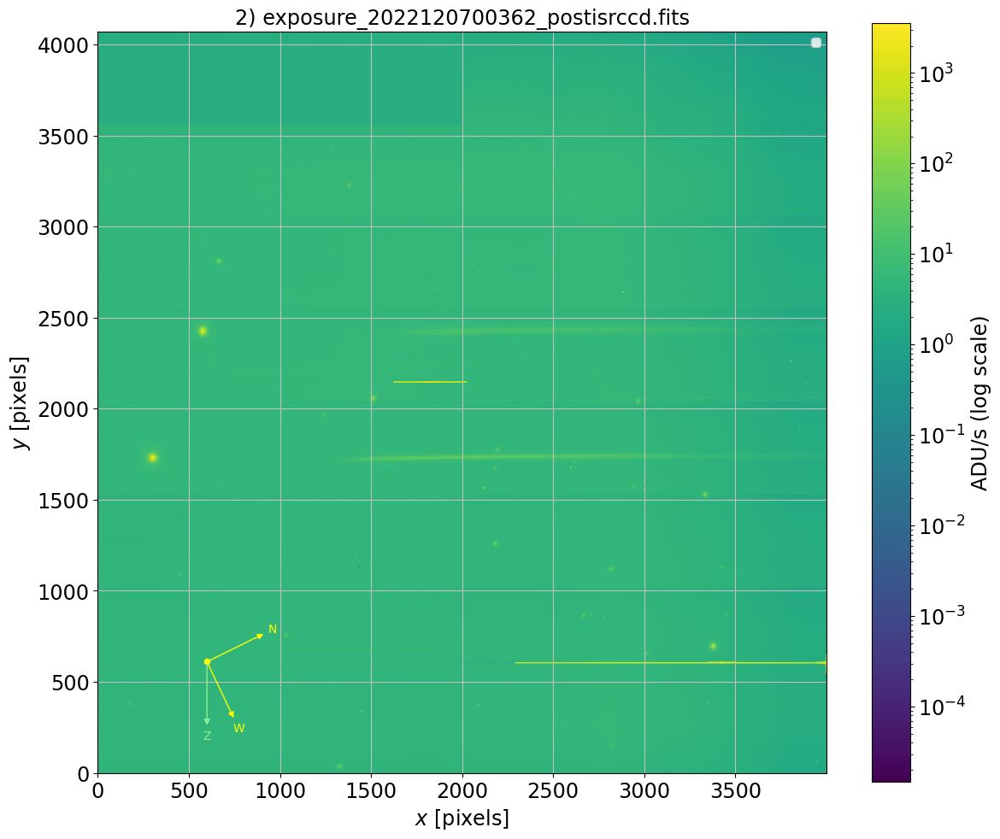

In [66]:
import matplotlib.pyplot as plt
title="{}) {}".format(idx,filename_image)
image.plot_image(figsize=(12, 10),scale="log",title=title)
plt.show()

- note now the position are written in the make_logbook.ipynb notebook

## Set the 0th order location to be provided to Spectractor

In [67]:
filename_image

'exposure_2022120700362_postisrccd.fits'

## Let Spectractor find the location of the 0th order

2022-12-09 13:02:54  spectractor.tools fit_poly2d_outlier_removal INFO   
	Model: Polynomial2D
Inputs: ('x', 'y')
Outputs: ('z',)
Model set size: 1
Degree: 1
Parameters:
           c0_0                c1_0                 c0_1        
    ----------------- --------------------- --------------------
    5.984076712311433 -0.007153957317719444 0.005086987838645544


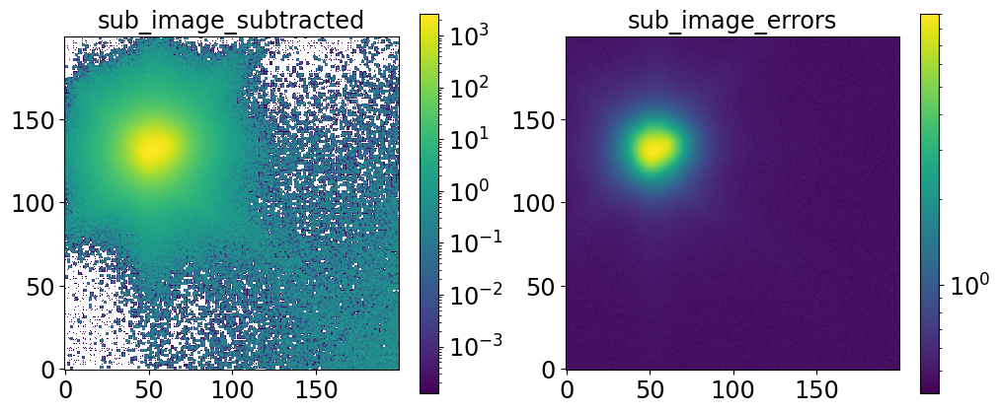

2022-12-09 13:02:55  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 9 iterations because the relative change of cost is below ftol=1.25e-05.


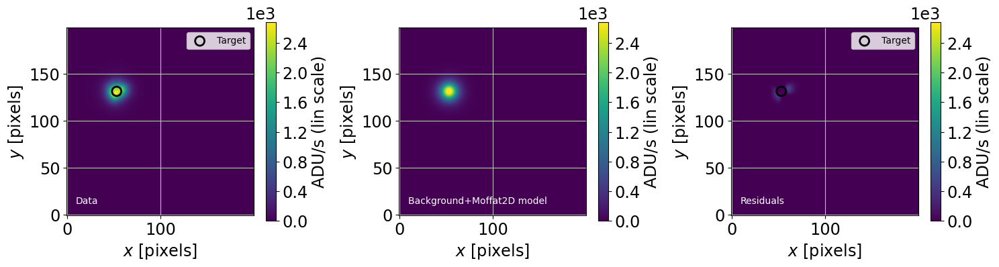

2022-12-09 13:02:56  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 2 iterations because the relative change of cost is below ftol=5e-05.


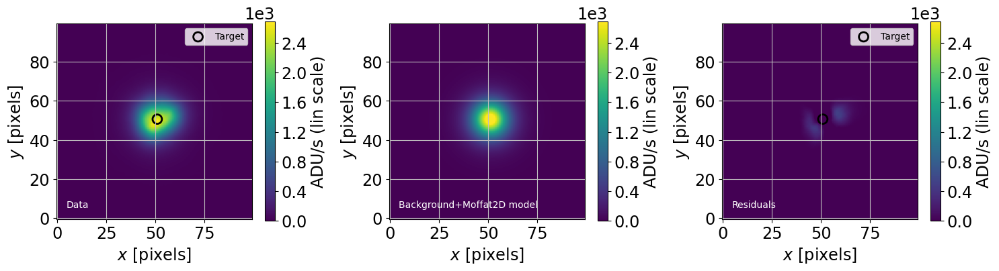

In [68]:
parameters.VERBOSE = True
parameters.DEBUG = True
#x1, y1 = find_target(image, guess,rotated=False, use_wcs=False)
x1, y1 = find_target(image, guess,rotated=False)

In [69]:
print(x1,y1)

302.9718613612672 1731.6199134899373


## Check the location of 0th order and Analysis of the quality of its focus

In [70]:
if x1>100:
    WID=100
else:
    WID=50
    

thumbnail=np.copy(image.data[int(y1)-WID:int(y1)+WID,int(x1)-WID:int(x1)+WID])
thumbnail_y=thumbnail.sum(axis=1)
thumbnail_x=thumbnail.sum(axis=0)
xx=np.linspace(int(x1)-WID,int(x1)+WID,len(thumbnail_x))
yy=np.linspace(int(y1)-WID,int(y1)+WID,len(thumbnail_y))
k0=kurtosis(thumbnail,axis=None,bias=True,fisher=True)
kx=kurtosis(thumbnail_x,bias=True,fisher=True)
ky=kurtosis(thumbnail_y,bias=True,fisher=True)
s0=skew(thumbnail,axis=None,bias=True)
sx=skew(thumbnail_x,bias=True)
sy=skew(thumbnail_y,bias=True)
        

In [71]:
shape_str='\n'.join((
        r'skew     : Sk0 = {:3.3f}, Skx = {:3.3f}, Sky = {:3.3f} \n'.format(s0,sx,sy),
        r'kurtosis : K0  = {:3.3f}, Kx  = {:3.3f},  Ky = {:3.3f}'.format(k0,kx,ky)))

In [72]:
skew_str='\n'.join((
        r'skew     : Sk0 = {:3.3f}'.format(s0),
        r'             : Skx = {:3.3f}'.format(sx),
        r'             : Sky = {:3.3f}'.format(sy)))

In [73]:
kurt_str='\n'.join((
        r'kurtosis : K0 = {:3.3f}'.format(k0),
        r'             : Kx = {:3.3f}'.format(kx),
        r'             : Ky = {:3.3f}'.format(ky)))

In [74]:
kurtosis_test_prob=kurtosistest(thumbnail,axis=None).pvalue
skew_test_prob=skewtest(thumbnail,axis=None).pvalue
normal_test_prob=normaltest(thumbnail,axis=None).pvalue

In [75]:
kurtosis_test_val=kurtosistest(thumbnail,axis=None).statistic
skew_test_val=skewtest(thumbnail,axis=None).statistic
normal_test_val=normaltest(thumbnail,axis=None).statistic

In [76]:
kurtosis_test_prob_x=kurtosistest(thumbnail_x).pvalue
skew_test_prob_x=skewtest(thumbnail_x).pvalue
normal_test_prob_x=normaltest(thumbnail_x).pvalue

In [77]:
kurtosis_test_prob_y=kurtosistest(thumbnail_y).pvalue
skew_test_prob_y=skewtest(thumbnail_y).pvalue
normal_test_prob_y=normaltest(thumbnail_y).pvalue

In [78]:
skew_str='\n'.join((
    r'skew     : Sk0 = {:3.3f}'.format(s0),
    r'             : Skx = {:3.3f}'.format(sx),
    r'             : Sky = {:3.3f}'.format(sy),
    r'             : p_test   = {:3.3e}'.format(skew_test_prob),
    r'             : p_test_x = {:3.3e}'.format(skew_test_prob_x),
    r'             : p_test_y = {:3.3e}'.format(skew_test_prob_y)))

In [79]:
kurt_str='\n'.join((
    r'kurtosis : K0 = {:3.3f}'.format(k0),
    r'             : Kx = {:3.3f}'.format(kx),
    r'             : Ky = {:3.3f}'.format(ky),
    r'             : p_test   = {:3.3e}'.format(kurtosis_test_prob),
    r'             : p_test_x = {:3.3e}'.format(kurtosis_test_prob_x),
    r'             : p_test_y = {:3.3e}'.format(kurtosis_test_prob_y)))

In [80]:
norm_str='\n'.join((
    r'normal  : p_test   = {:3.3e}'.format(normal_test_prob),
    r'             : p_test_x = {:3.3e}'.format(normal_test_prob_x),
    r'             : p_test_y = {:3.3e}'.format(normal_test_prob_y)))

In [81]:
props = dict(boxstyle='round',edgecolor="w",facecolor="w", alpha=0.5)

In [82]:
#matplotlib.pyplot.hist(x, 
#                       bins=10, 
#                       range=None, 
#                       normed=False, 
#                       weights=None, 
#                       cumulative=False, 
#                       bottom=None, 
#                       histtype=u'bar', 
#                       align=u'mid', 
#                       orientation=u'vertical', 
#                       rwidth=None, 
#                       log=False, 
#                       color=None, 
#                       label=None, 
#                       stacked=False, 
#                       hold=None, 
#                       **kwargs)

Text(0.5, 0.98, '2) exposure_2022120700362_postisrccd.fits')

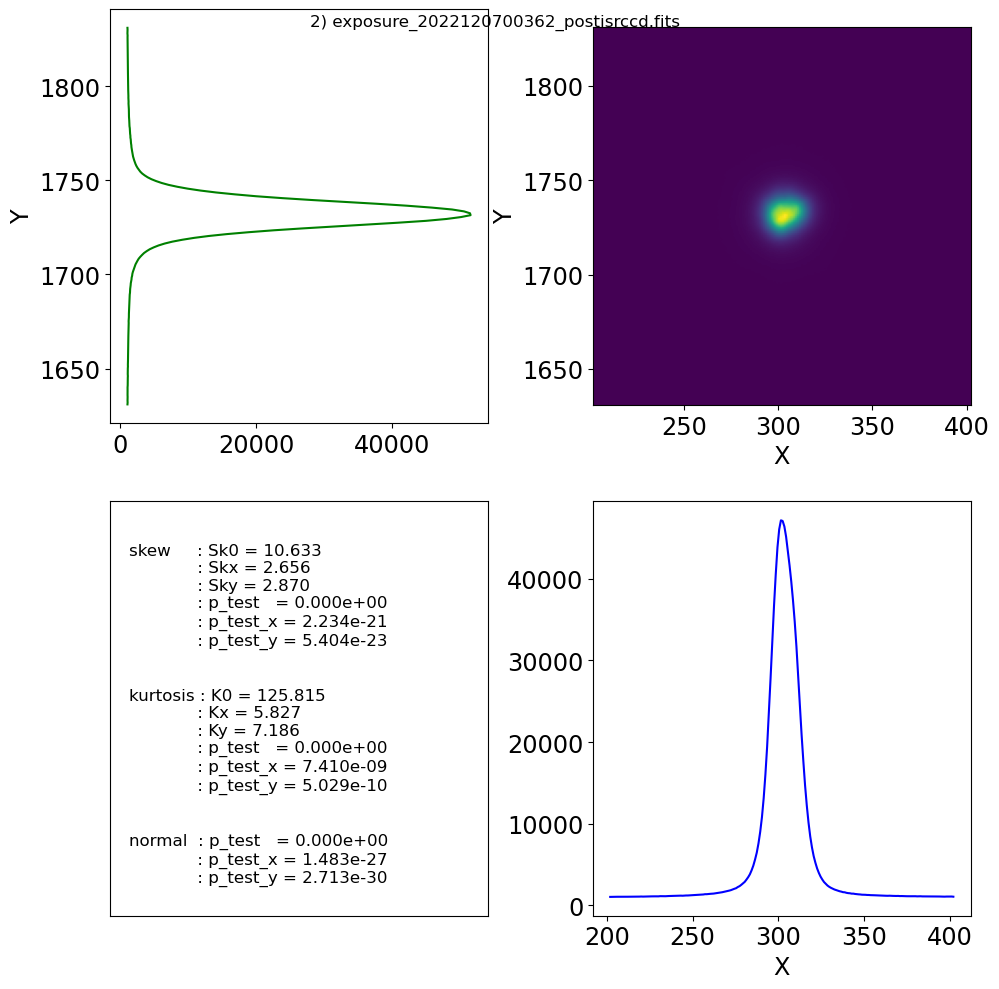

In [83]:
fig=plt.figure(figsize=(10,10))
fig.subplots_adjust(left=0.12, right=0.95, wspace=0.3,
                    bottom=0.15, top=0.9)

ax=fig.add_subplot(222)
ax.imshow(thumbnail,origin="lower",extent=(int(x1)-WID,int(x1)+WID,int(y1)-WID,int(y1)+WID))
ax.set_xlabel("X")
ax.set_ylabel("Y")

ax=fig.add_subplot(221)
base = plt.gca().transData
rot = transforms.Affine2D().rotate_deg(-90)
#ax.plot(yy,thumbnail_y,"g",rotation=u'vertical')
ax.plot(-yy,thumbnail_y,"g",transform= rot + base)
ax.set_ylabel("Y")

ax=fig.add_subplot(224)
ax.plot(xx,thumbnail_x,"b")
ax.set_xlabel("X")
plt.tight_layout()

ax=fig.add_subplot(223)
ax.set_xlim(0,10)
ax.set_ylim(0,10)
ax.set_xticklabels([])
ax.set_xticks([])
ax.set_yticks([])

ax.text(0.05, 0.9, skew_str, transform=ax.transAxes, fontsize=12,verticalalignment='top', bbox=props)
ax.text(0.05, 0.55, kurt_str, transform=ax.transAxes, fontsize=12,verticalalignment='top', bbox=props)
ax.text(0.05, 0.2, norm_str, transform=ax.transAxes, fontsize=12,verticalalignment='top', bbox=props)
plt.suptitle(title)

In [84]:
# Usually stop here if one just want to get the 0th order location
if not FLAG_GO_FOR_RECONSTRUCTION_WTH_SPECTRACTOR:
    assert False
else:
    assert True

# Go for spectrum reconstruction

In [85]:
parameters.debug=True
parameters.verbose=True
parameters.display=True
parameters.LIVE_FIT=False

parameters.DEBUG=True
parameters.VERBOSE=True
parameters.DISPLAY=True
parameters.LIVE_FIT=False

In [86]:
filename

'/sps/lsst/groups/auxtel/data/2023/empty~holo4_003/20221207/exposure_2022120700362_postisrccd.fits'

In [87]:
output_directory

'./outputs_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3'

2022-12-09 13:02:58  spectractor.extractor.extractor Spectractor          INFO   
	Start SPECTRACTOR
2022-12-09 13:02:58  Image      load_AUXTEL_image    INFO   
	Loading AUXTEL image /sps/lsst/groups/auxtel/data/2023/empty~holo4_003/20221207/exposure_2022120700362_postisrccd.fits...
2022-12-09 13:02:58  Image      load_AUXTEL_image    INFO   
	Image loaded


Section: paths
x disperser_dir: extractor/dispersers/	=> parameters.DISPERSER_DIR: /sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/Spectractor-2.3-py3.9.egg/spectractor/extractor/dispersers/	 <class 'str'>
x throughput_dir: simulation/AuxTelThroughput/	=> parameters.THROUGHPUT_DIR: /sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/Spectractor-2.3-py3.9.egg/spectractor/simulation/AuxTelThroughput/	 <class 'str'>
Section: pipeline
x spectractor_fit_target_centroid: fit	=> parameters.SPECTRACTOR_FIT_TARGET_CENTROID: fit	 <class 'str'>
x spectractor_compute_rotation_angle: disperser	=> parameters.SPECTRACTOR_COMPUTE_ROTATION_ANGLE: disperser	 <class 'str'>
x spectractor_deconvolution_psf2d: False	=> parameters.SPECTRACTOR_DECONVOLUTION_PSF2D: False	 <class 'bool'>
x spectractor_deconvolution_ffm: True	=> parameters.SPECTRACTOR_DECONVOLUTION_FFM: True	 <class 'bool'>
x spectractor_deconvolution_sigma_clip: 100	=> parameters.S

2022-12-09 13:02:58  Image      load_image           INFO   
	Loading disperser holo4_003...
2022-12-09 13:02:58  Hologram   load_specs           INFO   
	Load disperser holo4_003:
	from /sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/Spectractor-2.3-py3.9.egg/spectractor/extractor/dispersers/holo4_003
2022-12-09 13:02:58  Hologram   load_specs           INFO   
	Grating characteristics:
	N = 156.00 +/- 1.00 grooves/mm
	Average tilt of 0.2 degrees
2022-12-09 13:03:03  Image      check_statistical_error WARNING 
	Fitted read out noise seems to be different than input readout noise. Fit=4.2499266831128955 but average of self.read_out_noise is 8.5.
2022-12-09 13:03:03  Star       load                 INFO   
	Simbad:
 MAIN_ID        RA           DEC      ...  Z_VALUE  SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                           
--------- ------------- ------------- ... --------- ----------------
HD  74000 08 40 50.8036 -16 20 42.5

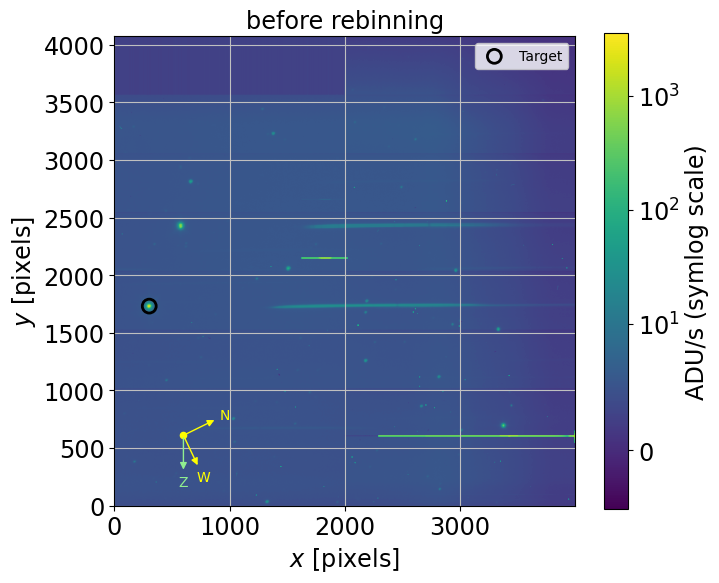

2022-12-09 13:03:08  spectractor.extractor.extractor Spectractor          INFO   
	  ======================= REBIN =============================


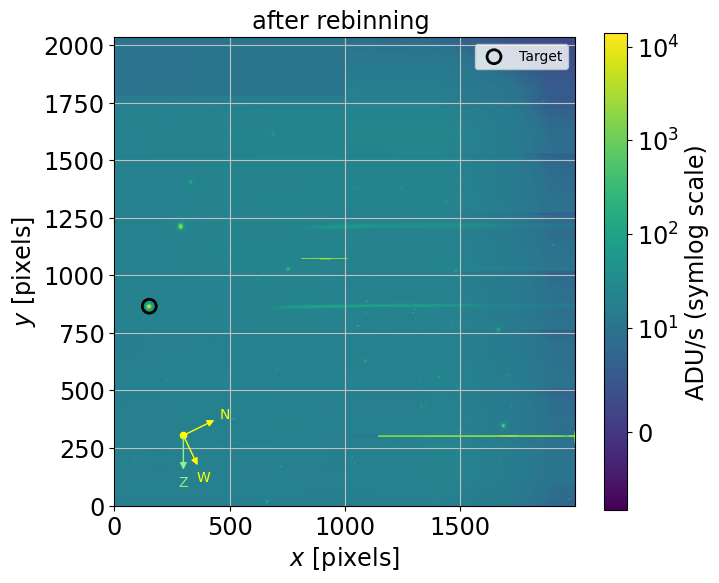

2022-12-09 13:03:09  spectractor.extractor.extractor Spectractor          INFO   
	Search for the target in the image with guess=[151.48593068 865.80995674]...
2022-12-09 13:03:09  spectractor.tools fit_poly2d_outlier_removal INFO   
	Model: Polynomial2D
Inputs: ('x', 'y')
Outputs: ('z',)
Model set size: 1
Degree: 1
Parameters:
           c0_0                c1_0                  c0_1         
    ------------------ -------------------- ----------------------
    22.341414044620493 0.005758189454402521 -0.0017147044103736362


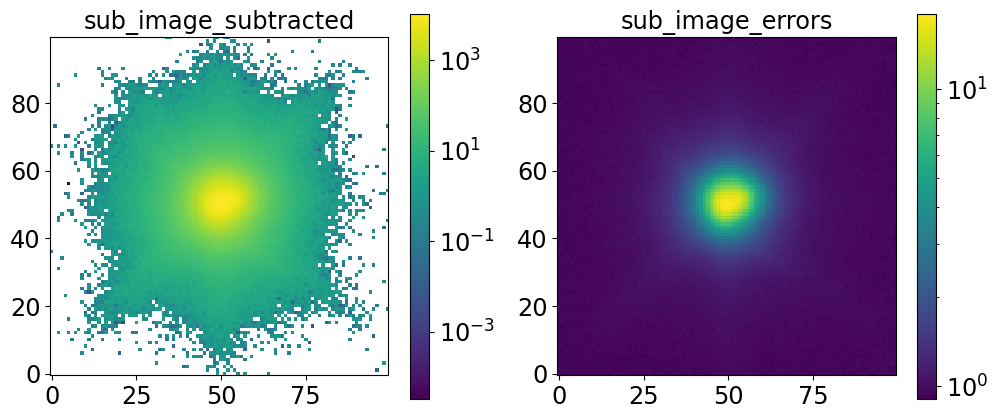

2022-12-09 13:03:10  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 5 iterations because the relative change of cost is below ftol=5e-05.


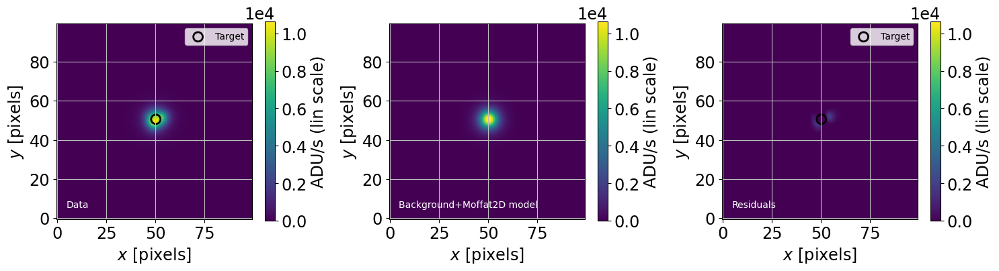

2022-12-09 13:03:11  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 2 iterations because the relative change of cost is below ftol=0.0002.


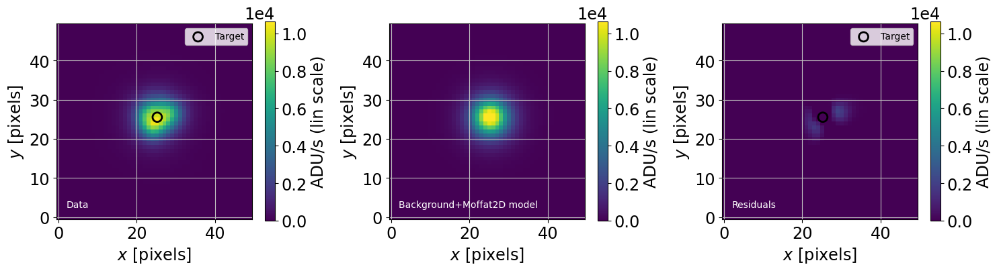

2022-12-09 13:03:12  Image      find_target          INFO   
	X,Y target position in pixels: 151.233,865.560
2022-12-09 13:03:12  Image      turn_image           INFO   
	Rotate the image with angle theta=0.20 degree


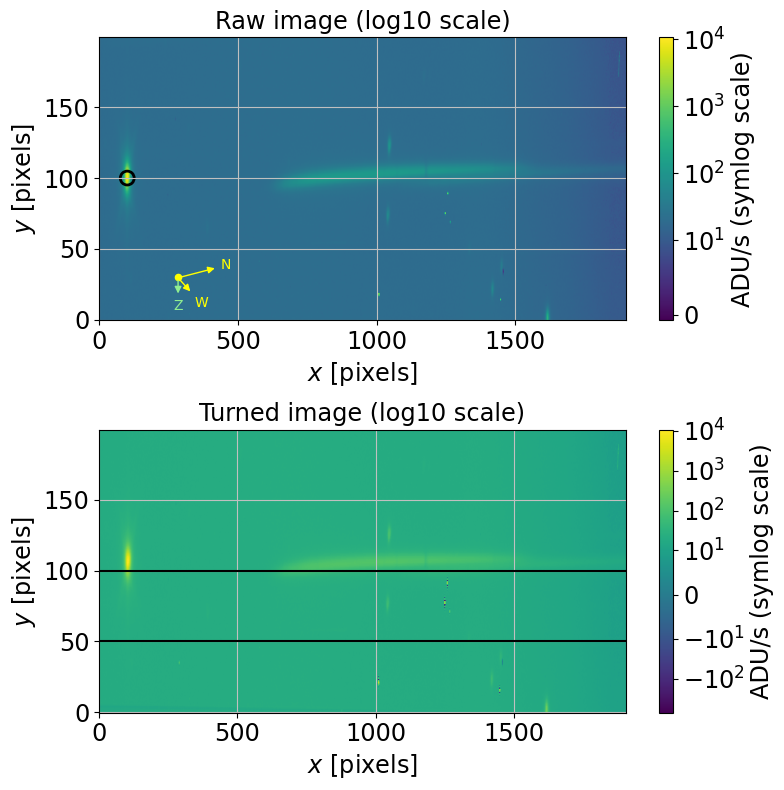

2022-12-09 13:03:15  spectractor.extractor.extractor Spectractor          INFO   
	Search for the target in the rotated image...
2022-12-09 13:03:15  spectractor.tools fit_poly2d_outlier_removal INFO   
	Model: Polynomial2D
Inputs: ('x', 'y')
Outputs: ('z',)
Model set size: 1
Degree: 1
Parameters:
           c0_0                c1_0                  c0_1       
    ----------------- ---------------------- -------------------
    35.80912126912714 -0.0017505479188793106 0.07638803147538395


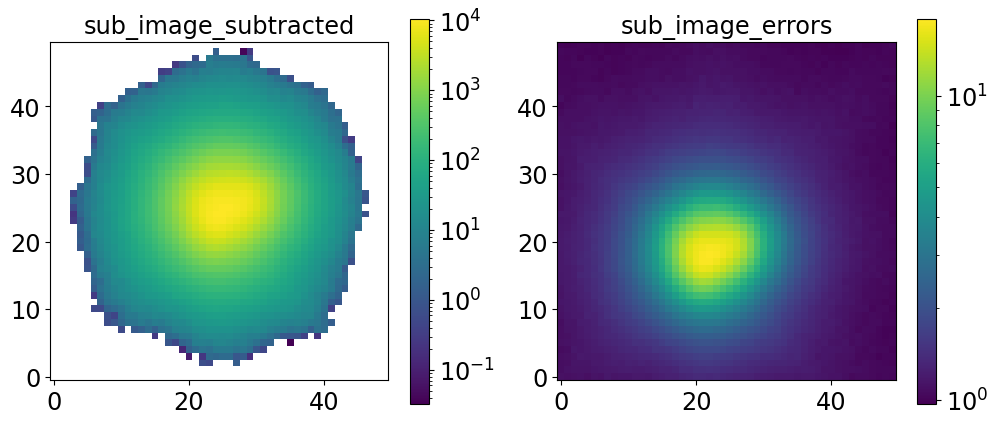

2022-12-09 13:03:16  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 4 iterations because the relative change of cost is below ftol=0.0002.


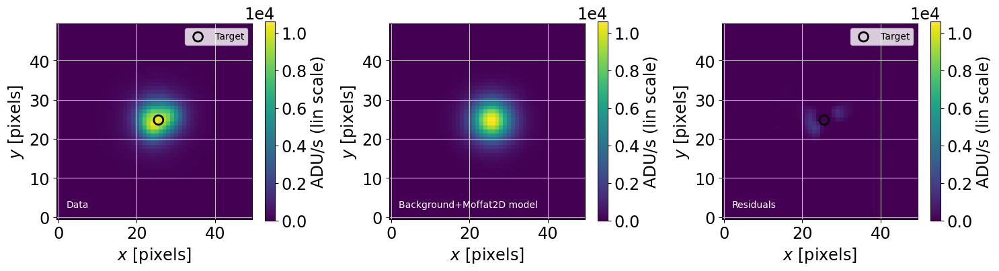

2022-12-09 13:03:16  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 3 iterations because the relative change of cost is below ftol=0.0008680555555555555.


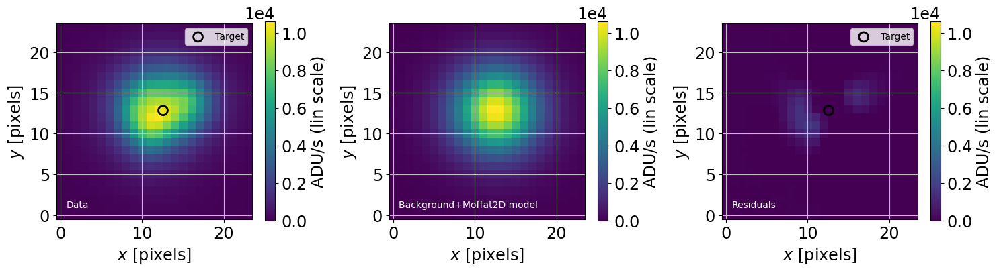

2022-12-09 13:03:17  Image      find_target          INFO   
	X,Y target position in pixels: 154.558,871.833
2022-12-09 13:03:17  Spectrum   __init__             INFO   
	Spectrum info copied from image
2022-12-09 13:03:17  spectractor.extractor.extractor Spectractor          INFO   
	  ======================= PSF1D Extraction ====================================
2022-12-09 13:03:17  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	  ======================= extract_spectrum_from_image =============================
2022-12-09 13:03:17  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	Extracting spectrum from image: spectrum with width 2*10 pixels and background from 70 to 90 pixels
2022-12-09 13:03:17  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	Extract spectrogram: crop rotated image [576:1722,781:961] (size (1146, 180))
        Use SegmentationImage.make_source_mask instead. [spectractor.extractor.background]
2022-12-09 

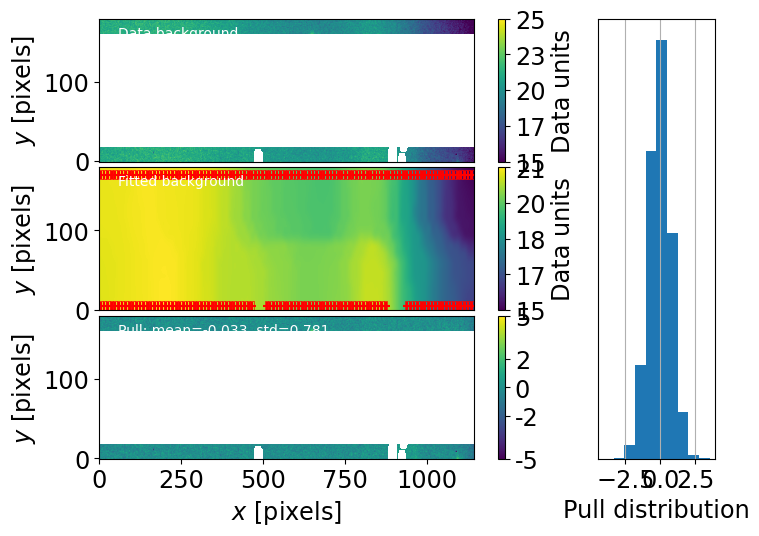

2022-12-09 13:03:19  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	  ======================= Fit the transverse profile =============================
2022-12-09 13:03:19  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	Start PSF1D transverse fit...
2022-12-09 13:03:19  spectractor.fit.fitter gradient_descent     WARNING 
	Step 0: stddev has a null Jacobian; parameter is fixed at its last known current value (1.0).
2022-12-09 13:03:19  spectractor.fit.fitter gradient_descent     WARNING 
	Step 0: stddev has a null Jacobian; parameter is fixed at its last known current value (1.0).
2022-12-09 13:03:19  spectractor.fit.fitter gradient_descent     WARNING 
	Step 0: stddev has a null Jacobian; parameter is fixed at its last known current value (1.0).
2022-12-09 13:03:19  spectractor.fit.fitter gradient_descent     WARNING 
	Step 0: stddev has a null Jacobian; parameter is fixed at its last known current value (1.0).
2022-12-09 13:03:19  spectracto

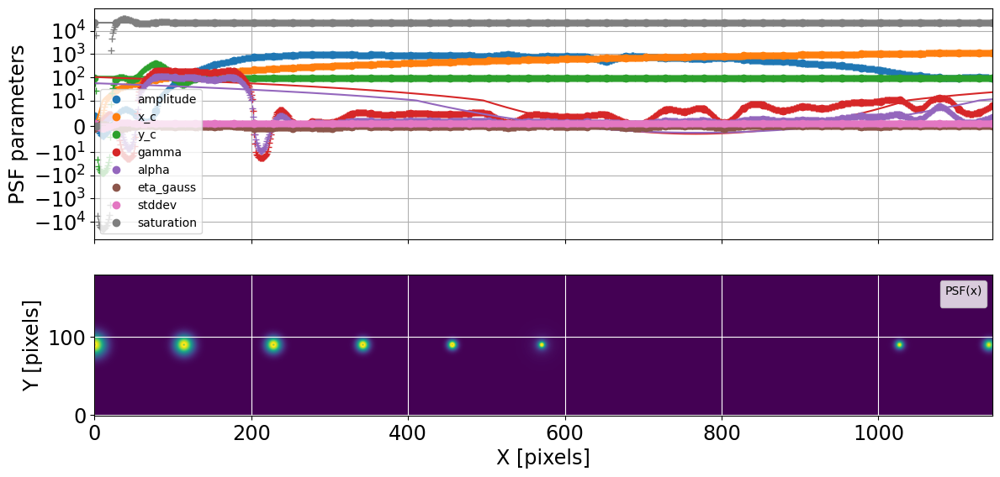

2022-12-09 13:03:23  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=0: initial cost=2.6709e+06 initial chisq_red=116.53
		 Line search: alpha_min=1.62 iter=1 funcalls=5
	Parameter shifts: [ 0.13584325  0.53504475  0.38339509  1.885586   -0.41507347  4.34981212
  3.3386473  -1.82914842  9.88101086  0.4223375  -0.41587417  0.7014131
  0.27225648  0.23122499 -0.42427787]
	New parameters: [-1.33517887  3.41991282 -2.54904185 20.62238018 -7.93168972 46.68297107
 12.7271296  -6.67129094 32.14842944  0.06136727 -0.15246203  0.32787906
  1.27225692  0.23122402 -0.42427697]
	Final cost=2.1742e+06 final chisq_red=94.862 computed in 0.74s
2022-12-09 13:03:23  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=1: initial cost=2.1742e+06 initial chisq_red=94.862
		 Line search: alpha_min=1.62 iter=1 funcalls=5
	Parameter shifts: [-0.27578347  0.60168114 -0.52401215  2.07000416 -2.08062634  3.76894607
  0.81924263 -0.97924393  1.1677415  -0.23945289  0.33074732 -0.4248024

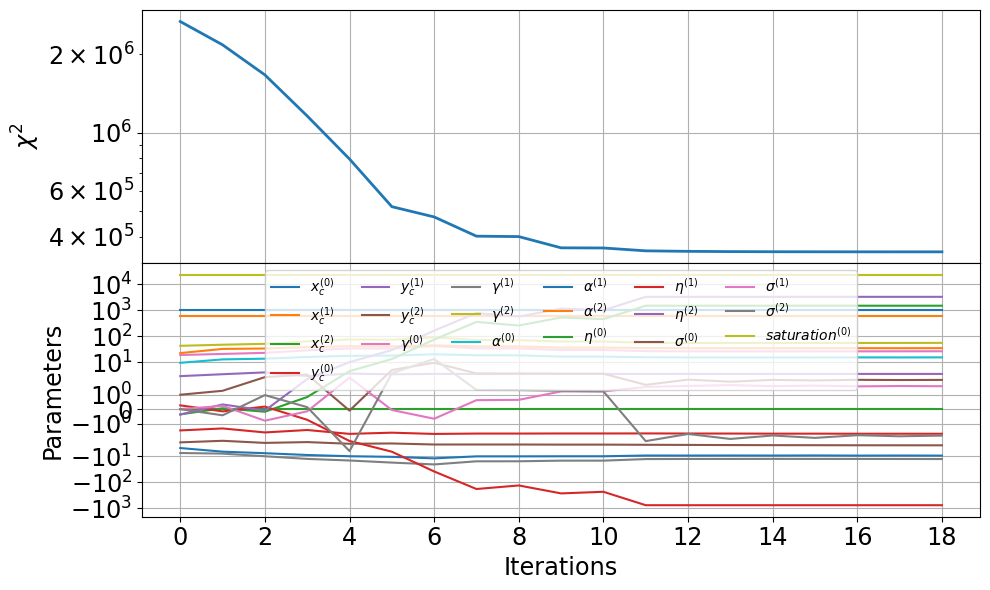

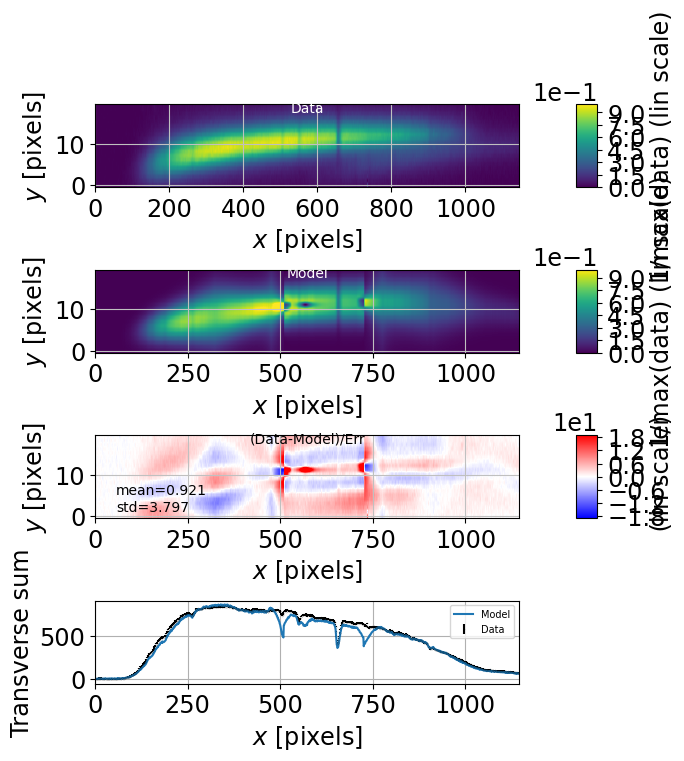

2022-12-09 13:03:38  ChromaticPSF1DFitWorkspace plot_correlation_matrix INFO   Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/parameters_correlation.pdf.


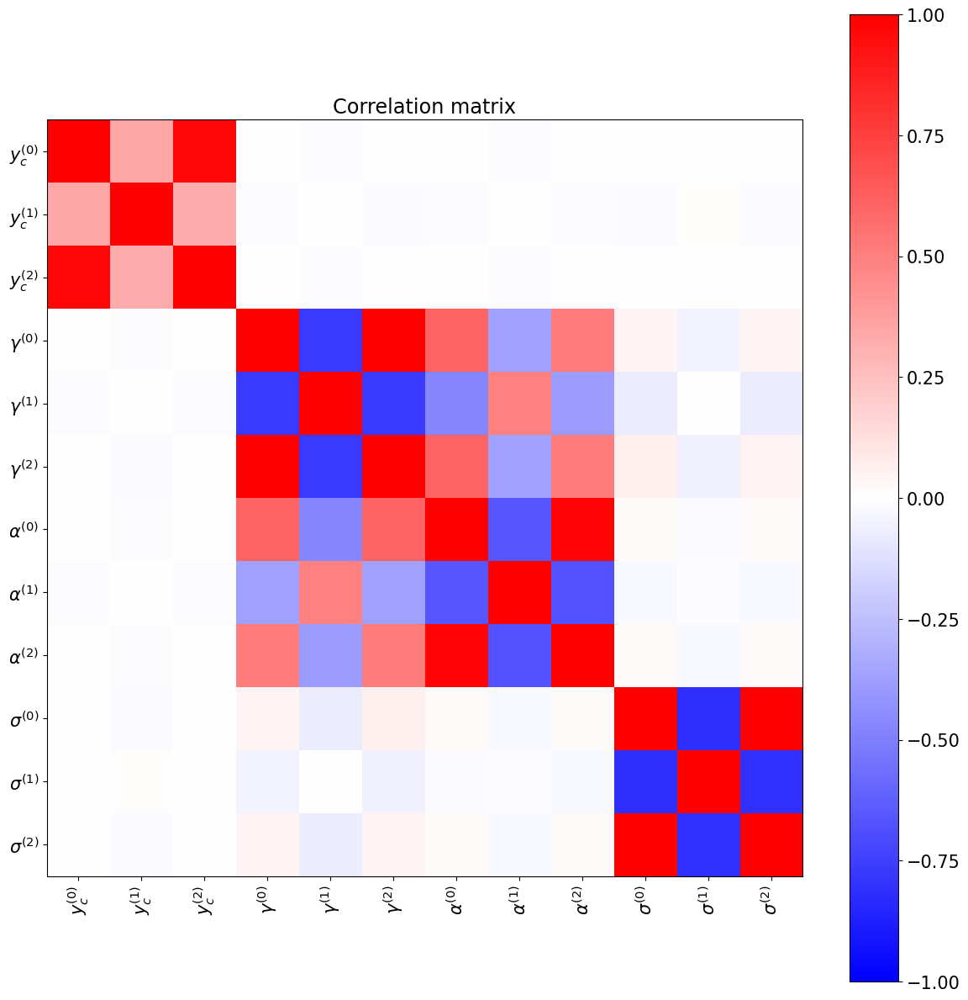

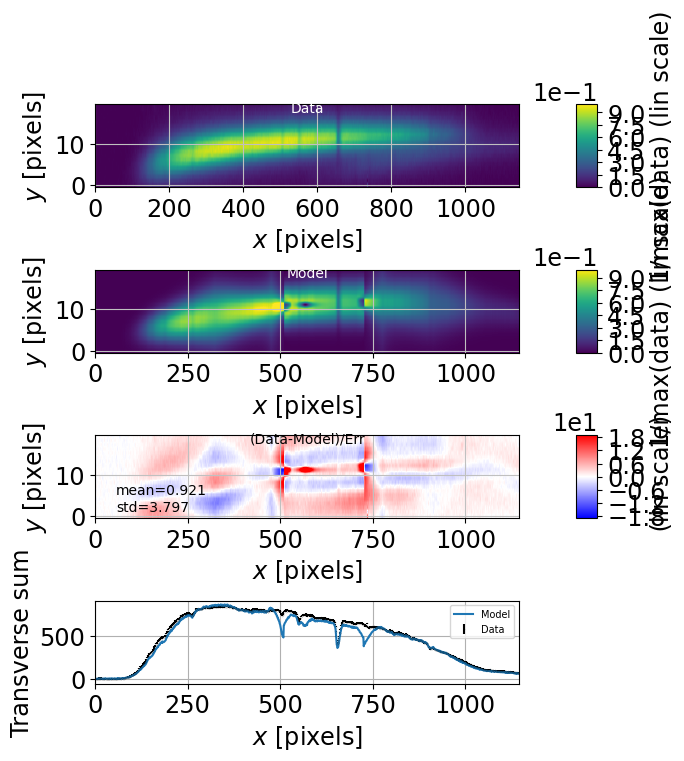

2022-12-09 13:03:41  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	Extract spectrogram: crop raw image [572:1718,776:961] (size (1146, 185))
2022-12-09 13:03:41  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	  ======================= Extract the non rotated background  =============================
        Use SegmentationImage.make_source_mask instead. [spectractor.extractor.background]
2022-12-09 13:03:41  astroquery _showwarning         WARNING AstropyDeprecationWarning: The make_source_mask function is deprecated and may be removed in a future version.
        Use SegmentationImage.make_source_mask instead.
2022-12-09 13:03:41  astroquery _showwarning         WARNING AstropyDeprecationWarning: "kernel" was deprecated in version 1.5 and will be removed in a future version. Instead, if filtering is desired, please input a convolved image directly into the "data" parameter.


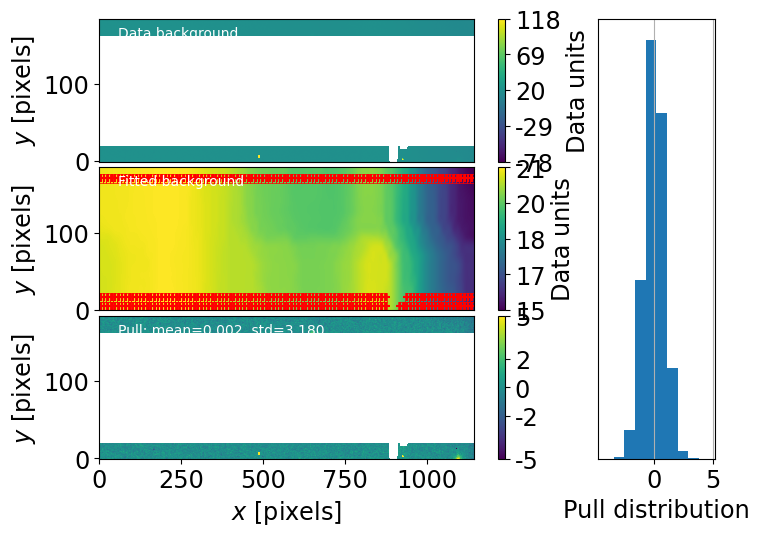

2022-12-09 13:03:42  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	Background statistics: mean=19.942 ADU/s, RMS=0.754 ADU/s.
2022-12-09 13:03:42  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	  ======================= first guess for lambdas  =============================
2022-12-09 13:03:42  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	Extract spectrogram: crop image [572:1718,776:961] (size (1146, 185))
	New target position in spectrogram frame: [-420.7666632333491, 89.56030466830043]


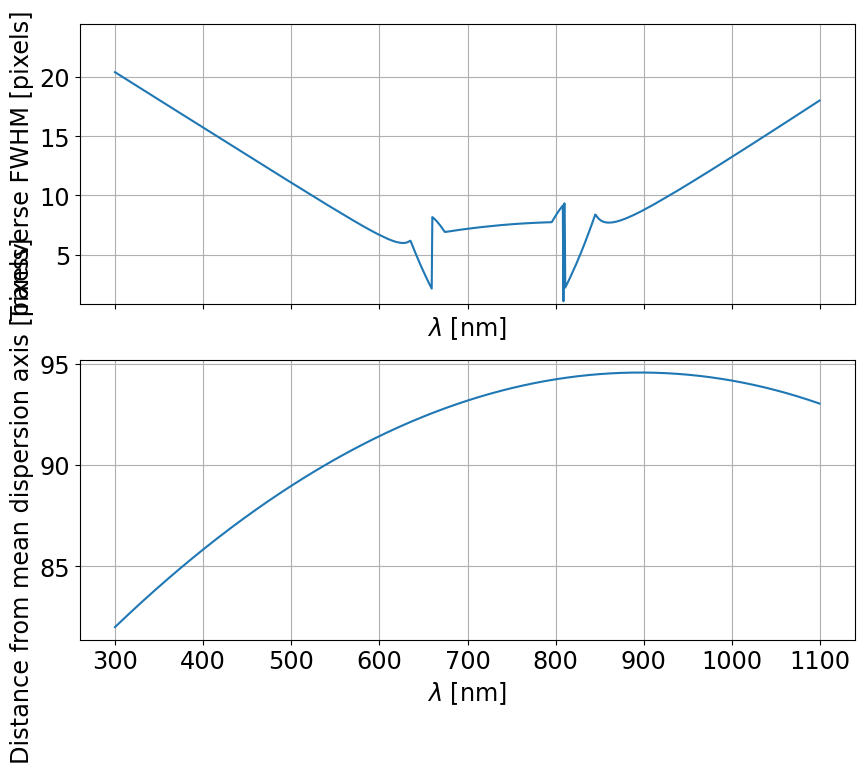

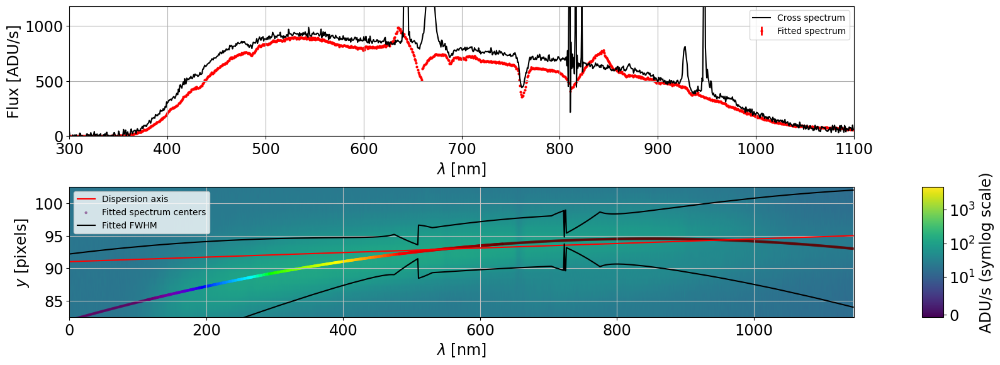

2022-12-09 13:03:44  spectractor.extractor.extractor Spectractor          INFO   
	Calibrating order 1 spectrum...


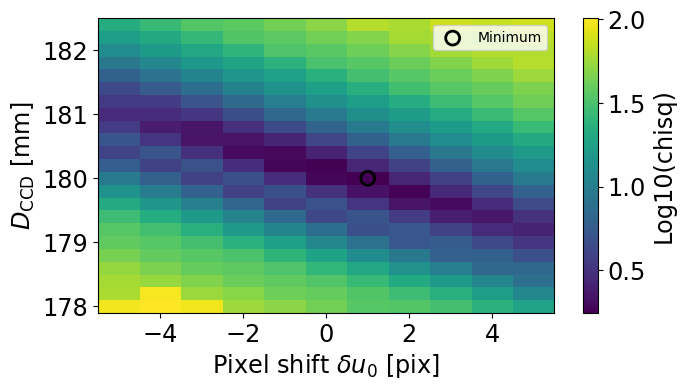

2022-12-09 13:03:58  Spectrum   calibrate_spectrum   INFO   
	Order0 total shift: 0.183pix
	D = 180.090 mm (default: DISTANCE2CCD = 180.00 +/- 0.40 mm, 0.2 sigma shift)
2022-12-09 13:03:58  spectractor.extractor.extractor Spectractor          INFO   
	  ======================= FFM DECONVOLUTION =============================
2022-12-09 13:03:58  FullForwardModelFitWorkspace set_mask             INFO   
	Reset spectrogram mask with current parameters.
2022-12-09 13:04:00  FullForwardModelFitWorkspace __init__             INFO   
	Full forward model fitting with regularisation parameter r=0.1.
2022-12-09 13:04:01  spectractor.extractor.extractor run_ffm_minimisation INFO   
 --- Start FFM with adjust_spectrogram_position_parameters --- 
2022-12-09 13:04:23  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=0: initial cost=2.6241e+06 initial chisq_red=91.592
		 Line search: alpha_min=1.62 iter=1 funcalls=5
	Parameter shifts: [-3.70530393  0.09449235]
	New parameters: [-3.70530

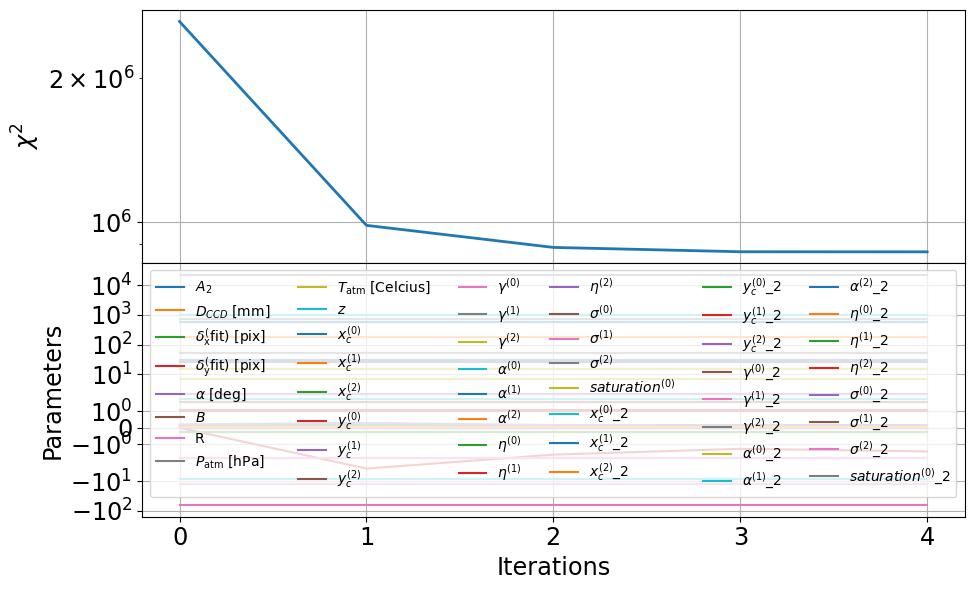

2022-12-09 13:05:27  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/ffm_bestfit.pdf.
2022-12-09 13:05:29  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/ffm_bestfit_2.pdf.


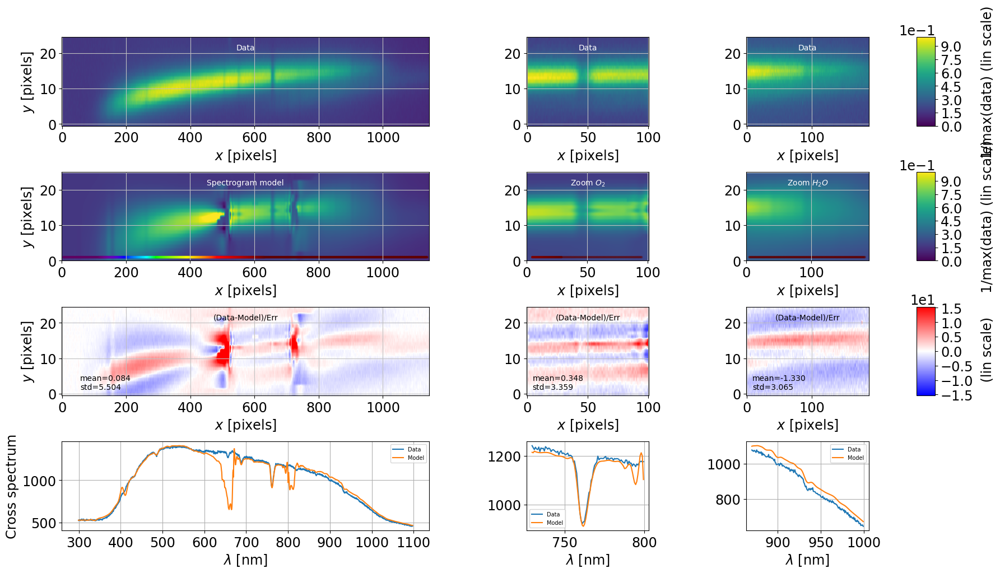

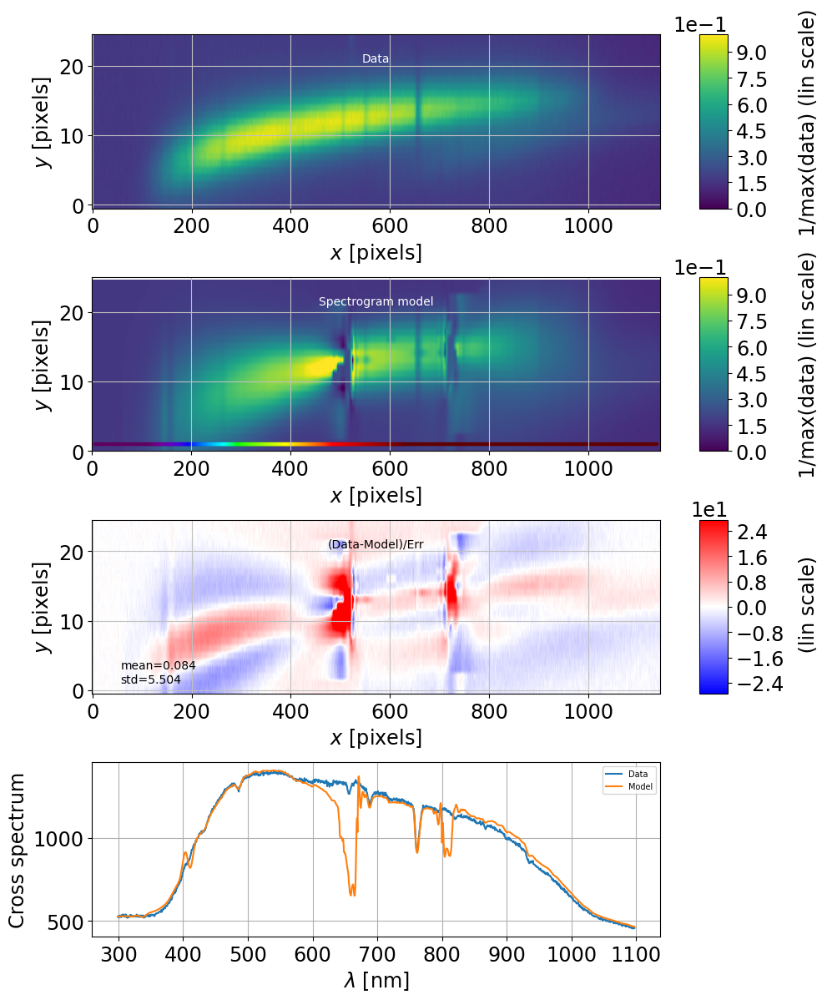

2022-12-09 13:05:31  FullForwardModelFitWorkspace plot_correlation_matrix INFO   Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/parameters_correlation.pdf.


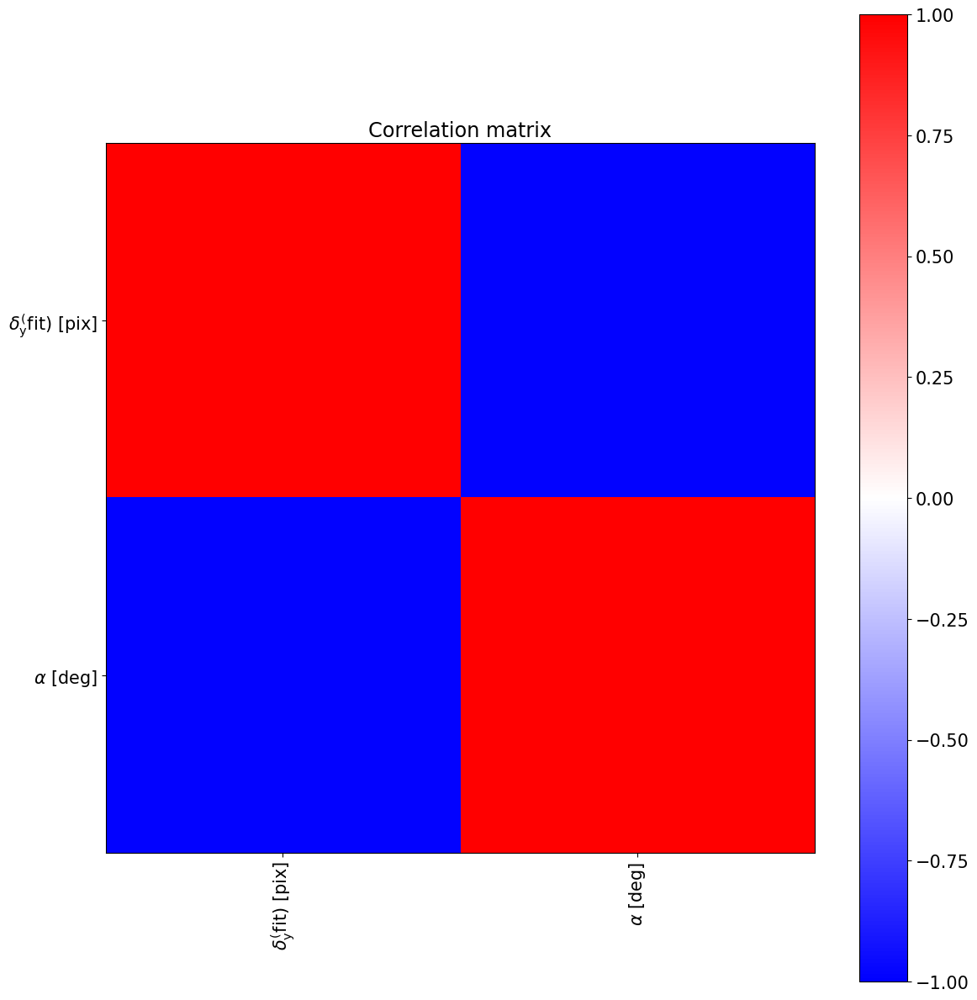

2022-12-09 13:05:32  FullForwardModelFitWorkspace set_mask             INFO   
	Reset spectrogram mask with current parameters.
2022-12-09 13:05:37  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/ffm_bestfit.pdf.
2022-12-09 13:05:39  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/ffm_bestfit_2.pdf.


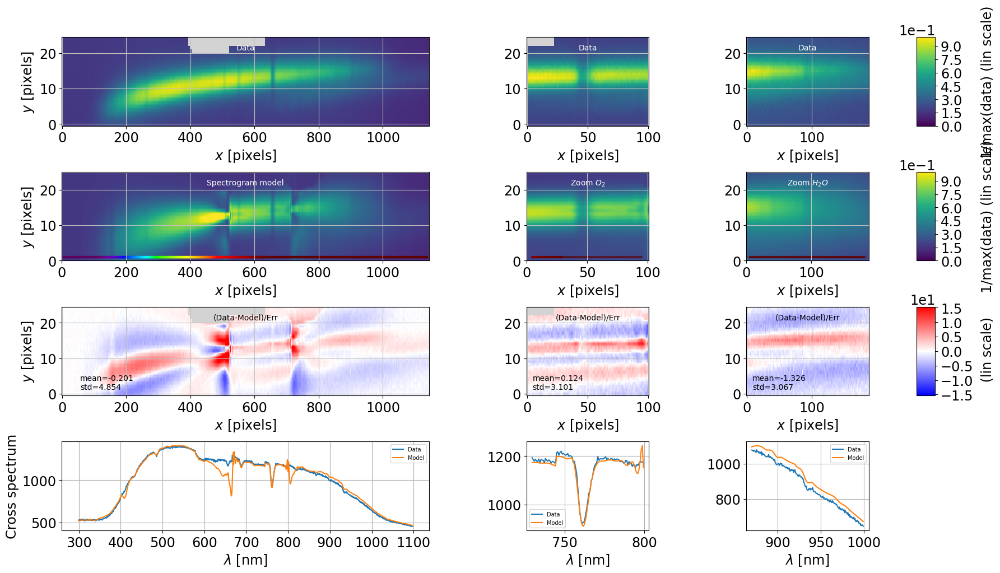

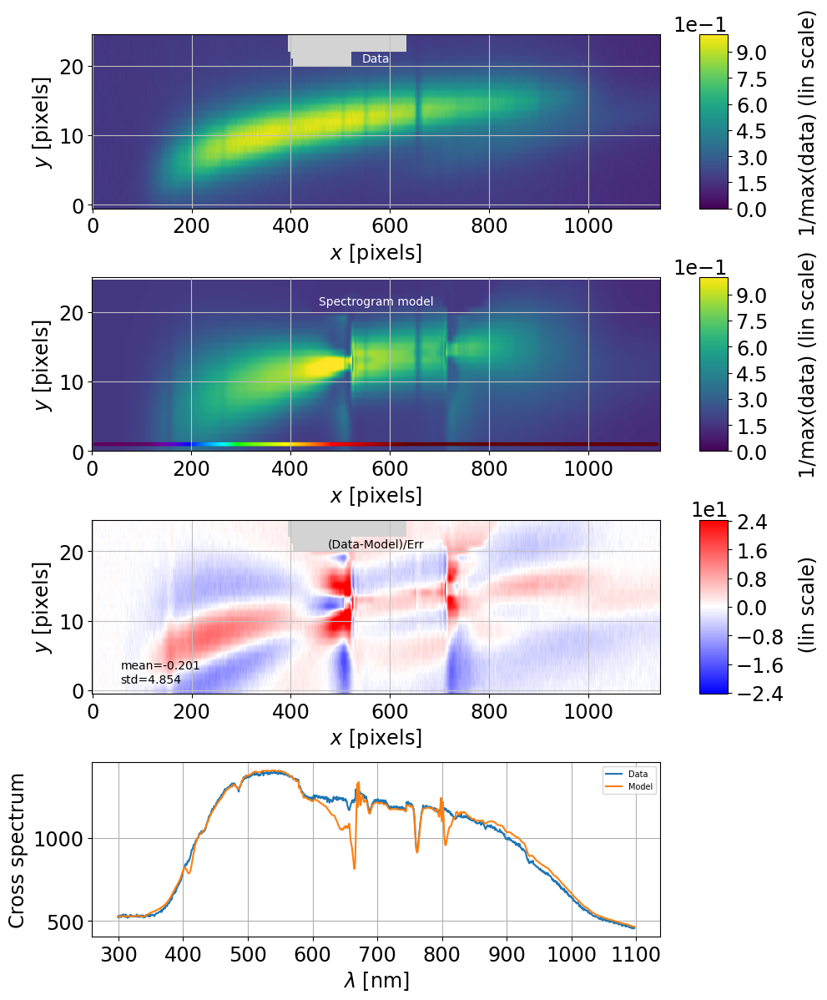

2022-12-09 13:05:41  spectractor.extractor.extractor run_ffm_minimisation INFO   
	Start guess: [ 1.00000000e+00  1.80090241e+02  1.83248735e-01 -1.43910374e+00
  1.39867565e-01  1.00000000e+00 -6.41869331e+01  7.40000000e+02
  7.00000000e+00  1.72219171e+00  9.93935592e+02  5.72496512e+02
 -1.28269167e-13  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.61170705e+01 -1.25805143e+01  5.37743390e+01  1.51520417e+01
 -8.62054516e+00  3.11468192e+01  3.51078744e-02 -2.28966721e-01
  1.06746841e+00  2.06975018e+00  1.58861645e+00 -1.82911438e+00
  2.26666738e+04  9.93935592e+02  5.72496512e+02 -1.28269167e-13
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.61170705e+01
 -1.25805143e+01  5.37743390e+01  1.51520417e+01 -8.62054516e+00
  3.11468192e+01  3.51078744e-02 -2.28966721e-01  1.06746841e+00
  2.06975018e+00  1.58861645e+00 -1.82911438e+00  2.26666738e+04]
	with ['A2', 'D_CCD [mm]', 'shift_x [pix]', 'shift_y [pix]', 'angle [deg]', 'B', 'R', 'P [hPa]', 'T [Celsius]', 'z', 'x_c_0

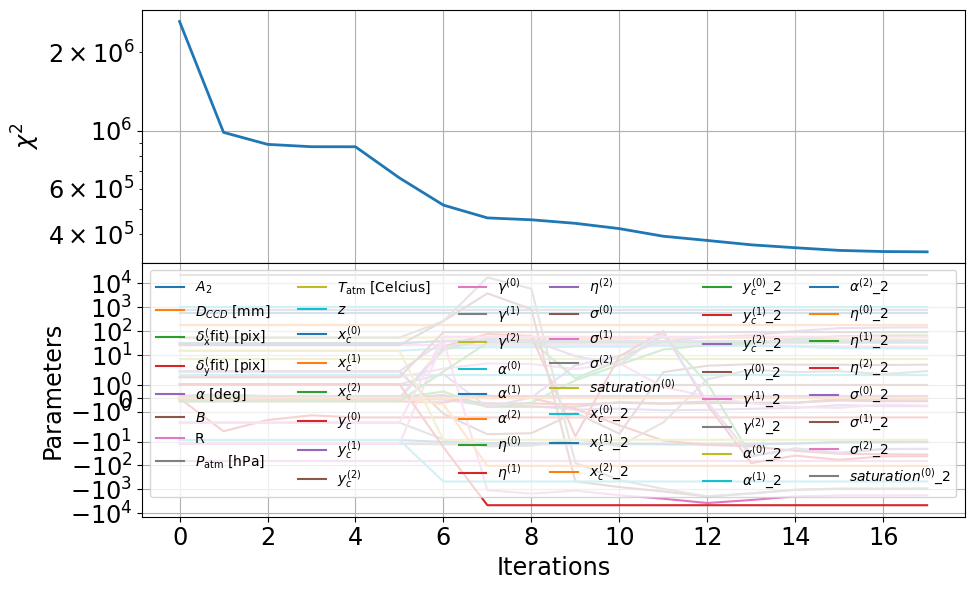

2022-12-09 13:21:00  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/ffm_bestfit.pdf.
2022-12-09 13:21:02  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/ffm_bestfit_2.pdf.


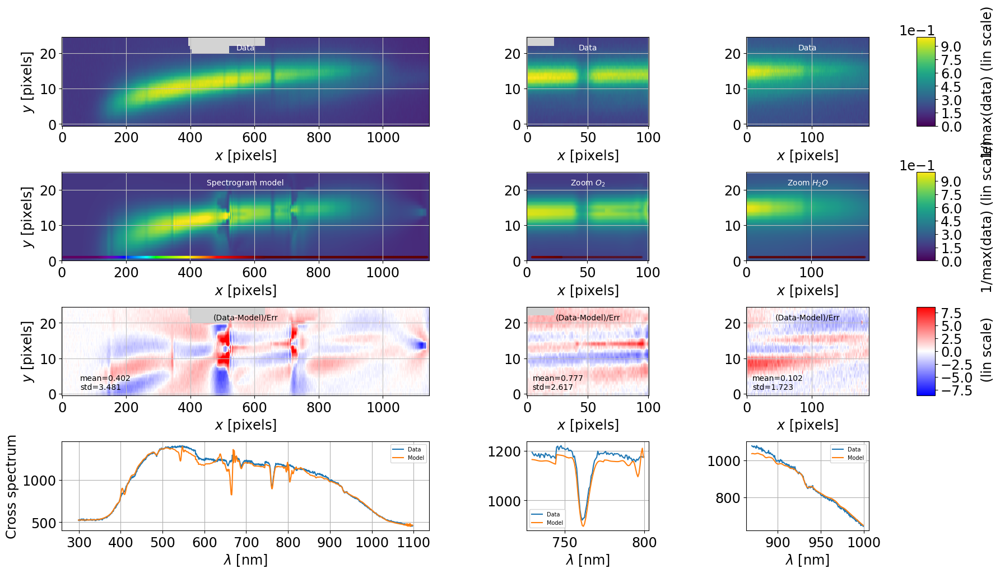

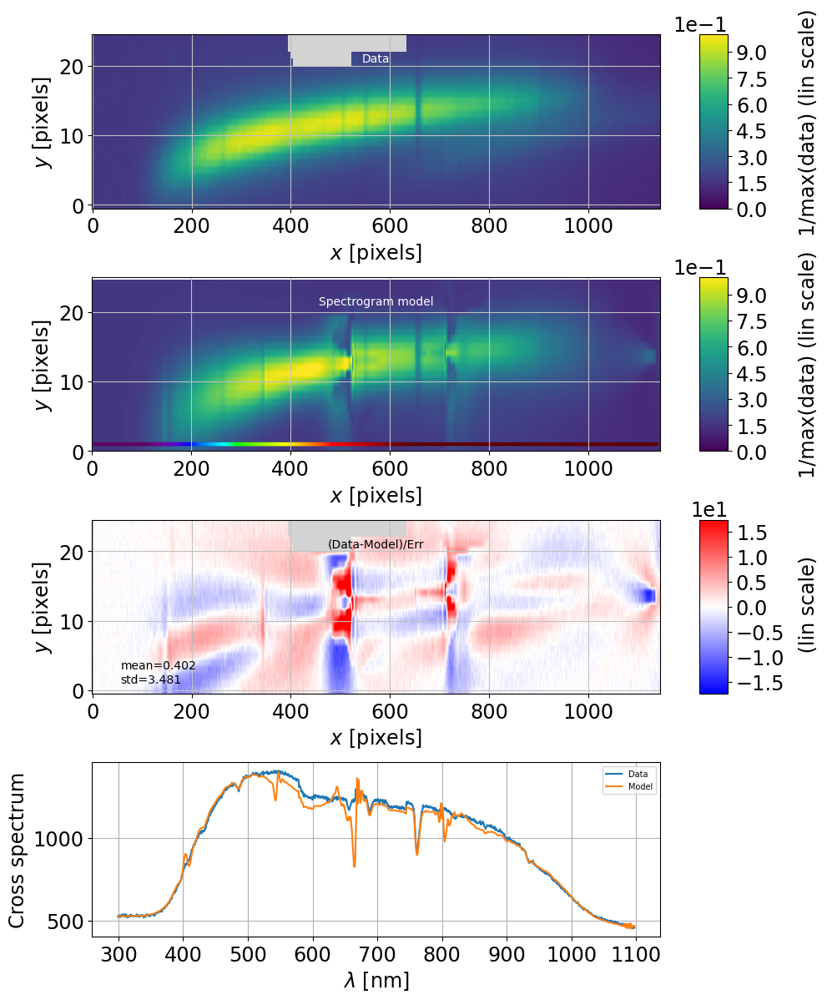

2022-12-09 13:21:04  FullForwardModelFitWorkspace plot_correlation_matrix INFO   Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/parameters_correlation.pdf.


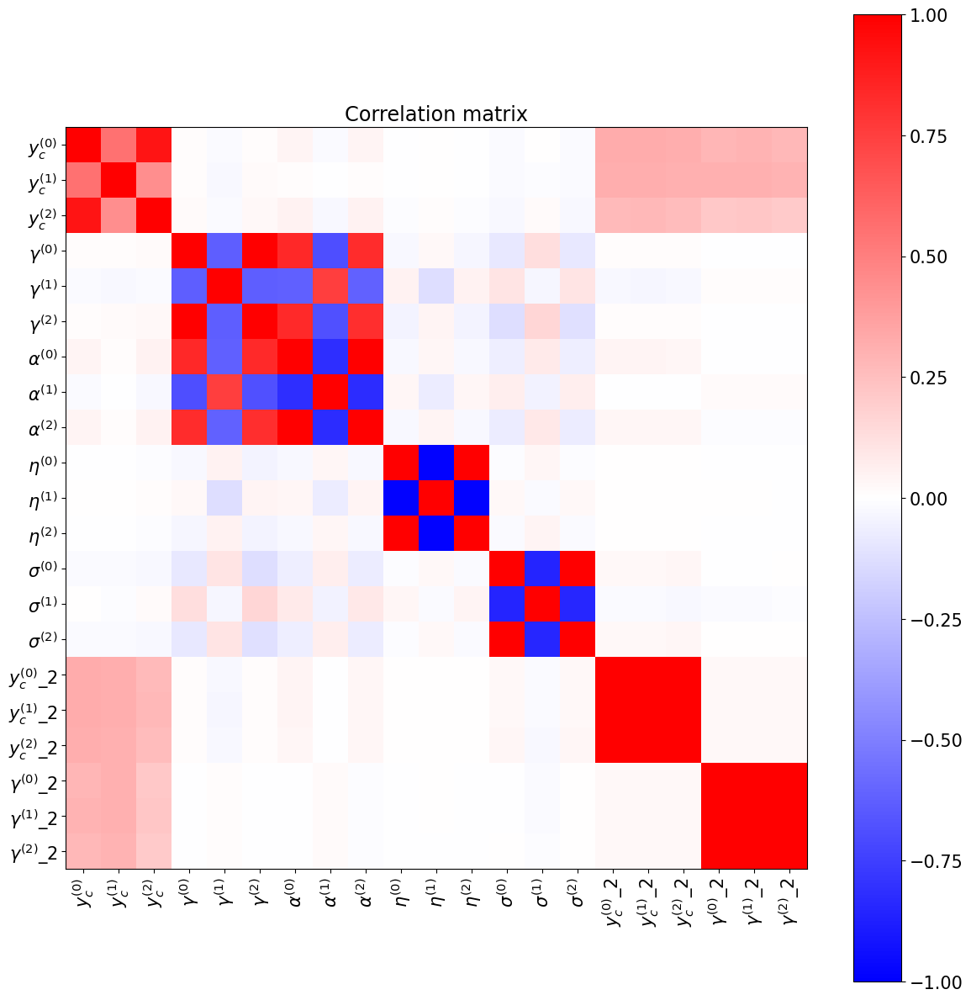

2022-12-09 13:21:06  spectractor.extractor.extractor run_ffm_minimisation INFO   
 --- after  run_minimisation ---
2022-12-09 13:21:06  spectractor.extractor.extractor dumpfitparameters    INFO   

- fit param #0 :: A2 = 1.0 	 fixed = True 	 bounds 0.000 - 20.000
- fit param #1 :: D_CCD [mm] = 180.0902414871338 	 fixed = True 	 bounds 178.890 - 181.290
- fit param #2 :: shift_x [pix] = 0.18324873500264732 	 fixed = True 	 bounds -5.000 - 5.000
- fit param #3 :: shift_y [pix] = -1.4391037387594428 	 fixed = True 	 bounds -50.000 - 50.000
- fit param #4 :: angle [deg] = 0.13986756501869305 	 fixed = True 	 bounds -90.000 - 90.000
- fit param #5 :: B = 1.0 	 fixed = True 	 bounds 0.200 - 5.000
- fit param #6 :: R = -64.18693306408039 	 fixed = True 	 bounds -360.000 - 360.000
- fit param #7 :: P [hPa] = 740.0 	 fixed = True 	 bounds 300.000 - 1100.000
- fit param #8 :: T [Celsius] = 7.0 	 fixed = True 	 bounds -100.000 - 100.000
- fit param #9 :: z = 1.722191708193619 	 fixed = True 	 bou

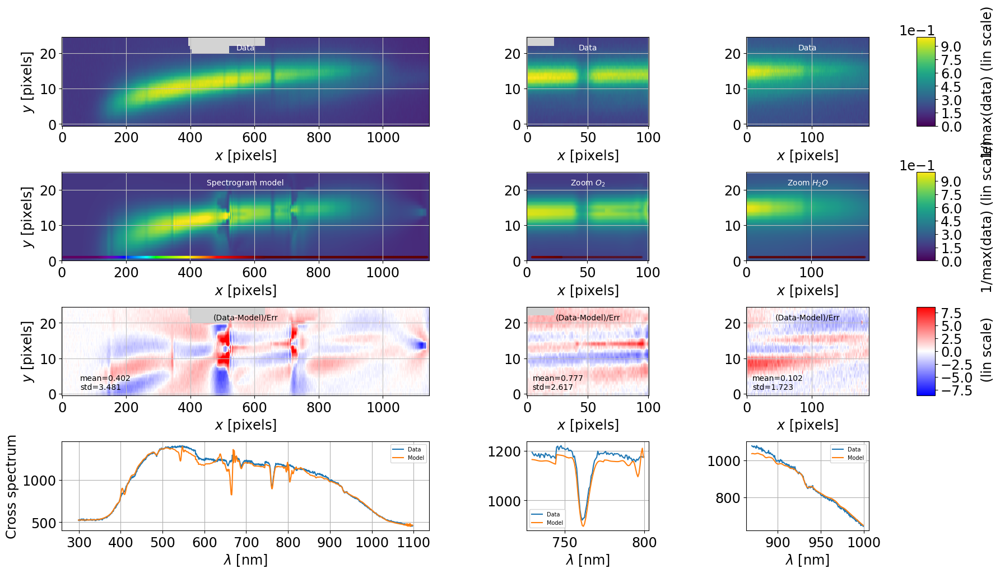

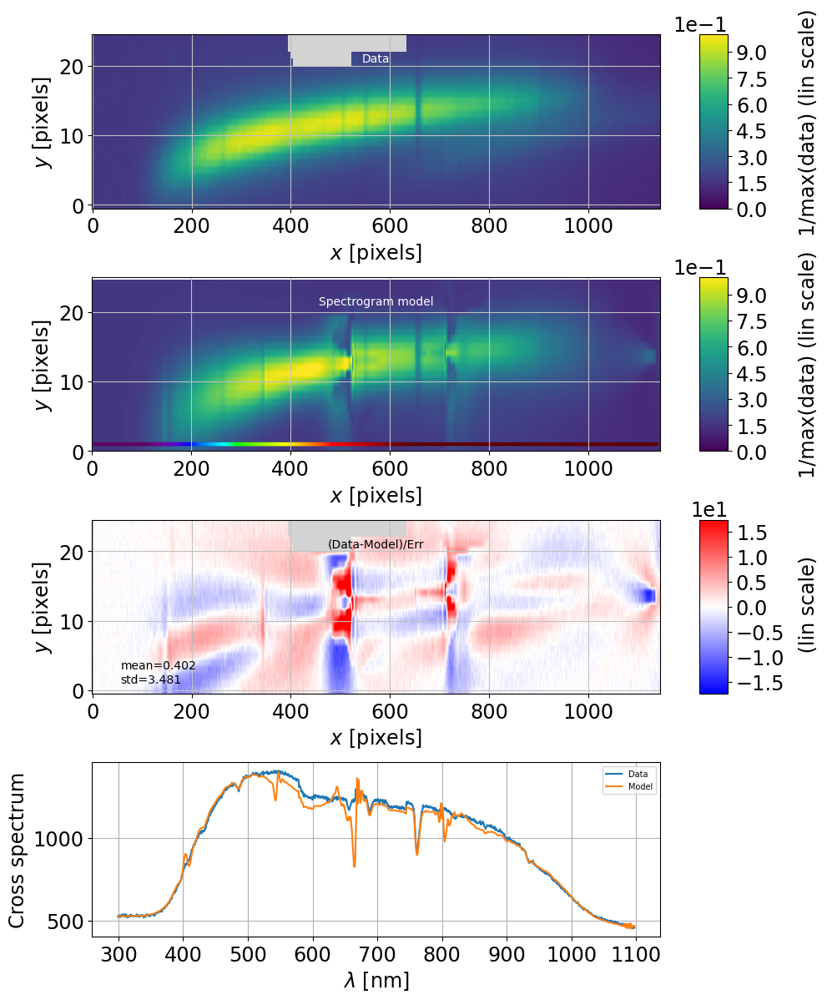

2022-12-09 13:21:11  spectractor.extractor.extractor run_ffm_minimisation INFO   
 --- Start regularization parameter only  ---
/sps/lsst/groups/auxtel/softs/utils/anaconda3_nov2022/lib/python3.9/site-packages/Spectractor-2.3-py3.9.egg/spectractor/fit/fitter.py:1334: OptimizeWarning: Unknown solver options: ftol
  result = optimize.minimize(nll, fit_workspace.p, method=minimizer_method,


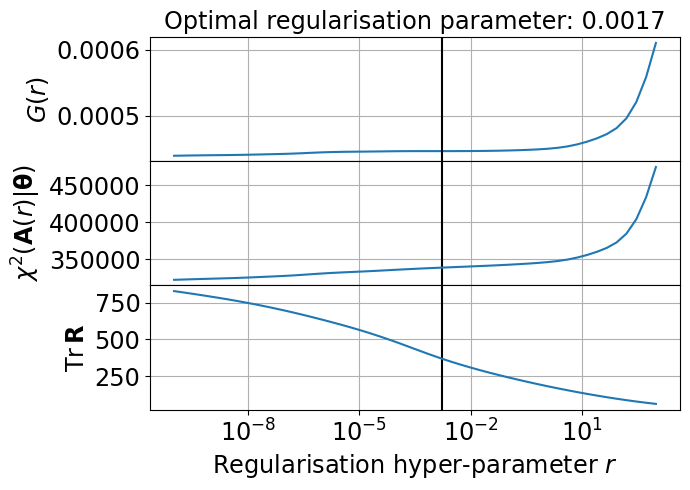

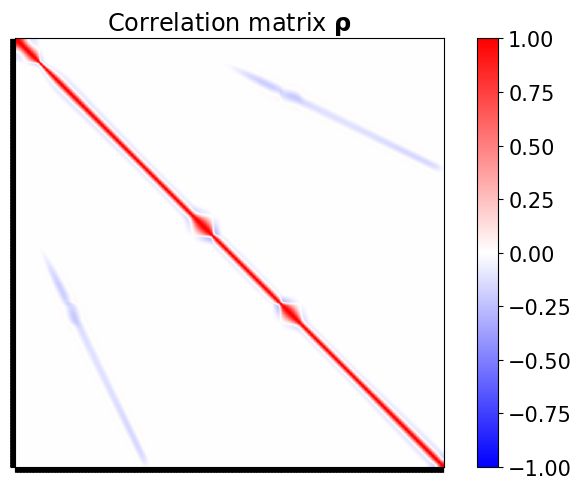

2022-12-09 13:21:39  RegFitWorkspace print_regularisation_summary INFO   
	Optimal regularisation parameter: 0.0017000776188228592
	Tr(R) = 368.2567187705472
	N_params = 1146
	N_data = 27941 (without mask and outliers)
2022-12-09 13:21:43  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/ffm_bestfit.pdf.
2022-12-09 13:21:44  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/ffm_bestfit_2.pdf.


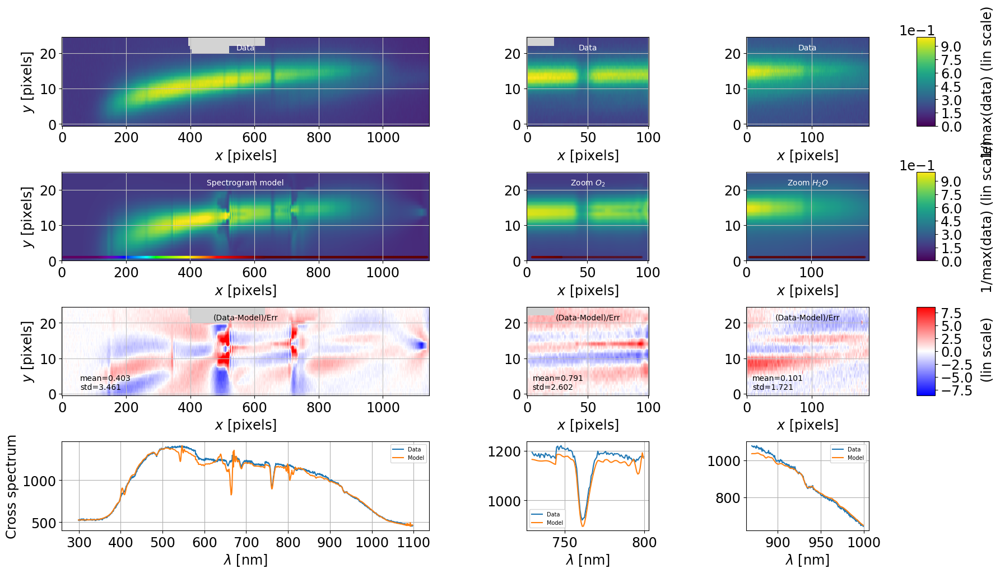

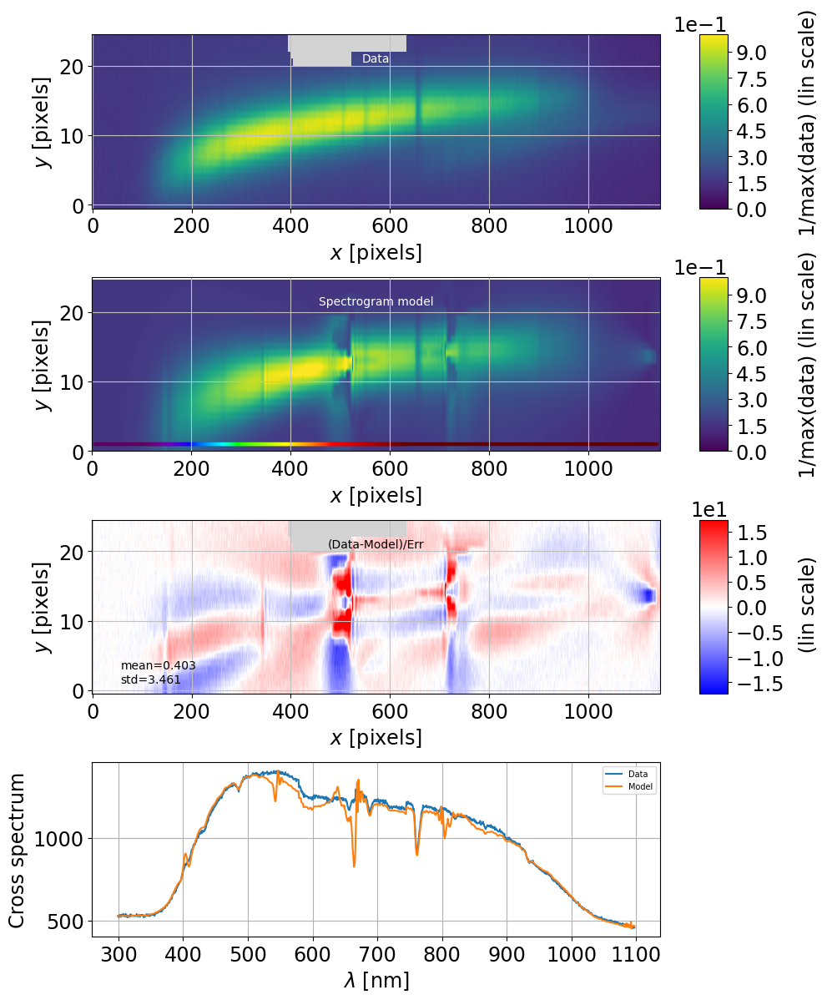

2022-12-09 13:21:46  spectractor.extractor.extractor run_ffm_minimisation INFO   
 --- Start run_minimisation_sigma_clipping  ---
2022-12-09 13:21:46  FullForwardModelFitWorkspace set_mask             INFO   
	Reset spectrogram mask with current parameters.
2022-12-09 13:21:48  spectractor.fit.fitter run_minimisation_sigma_clipping INFO   
	Sigma-clipping step 0/3 (sigma=100)
2022-12-09 13:22:41  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=0: initial cost=1.9892e+05 initial chisq_red=7.4387
		 Line search: alpha_min=1 iter=1 funcalls=5
	Parameter shifts: [ 6.62025303e-02  6.13623888e-02  1.93661678e-01 -5.27408972e+00
  2.57782876e+00 -1.12364095e+01 -7.65923060e+00  4.27788336e+00
 -1.80350445e+01  1.26971478e+01 -6.07406152e+00  2.70631944e+01
 -1.16189066e+00  6.56829445e-02 -2.39946254e+00  1.00629525e+01
  1.89184574e+01  9.78456136e+00  4.68645117e+01  8.60481587e+01
  4.85206815e+01]
	New parameters: [-1.57155555e-01 -5.32716909e-01  4.12536847e-02  1.69543870

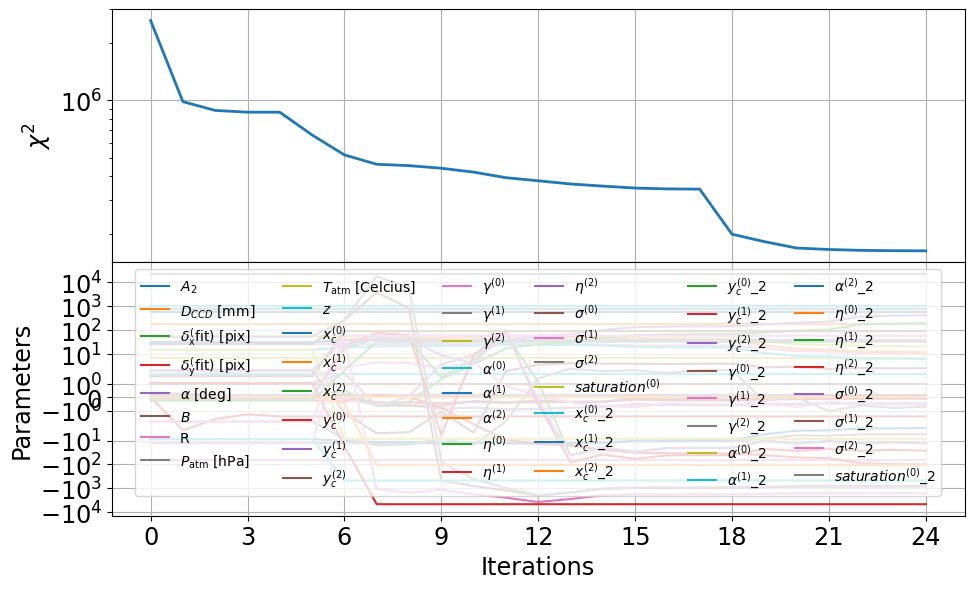

2022-12-09 13:27:01  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/ffm_bestfit.pdf.
2022-12-09 13:27:02  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/ffm_bestfit_2.pdf.


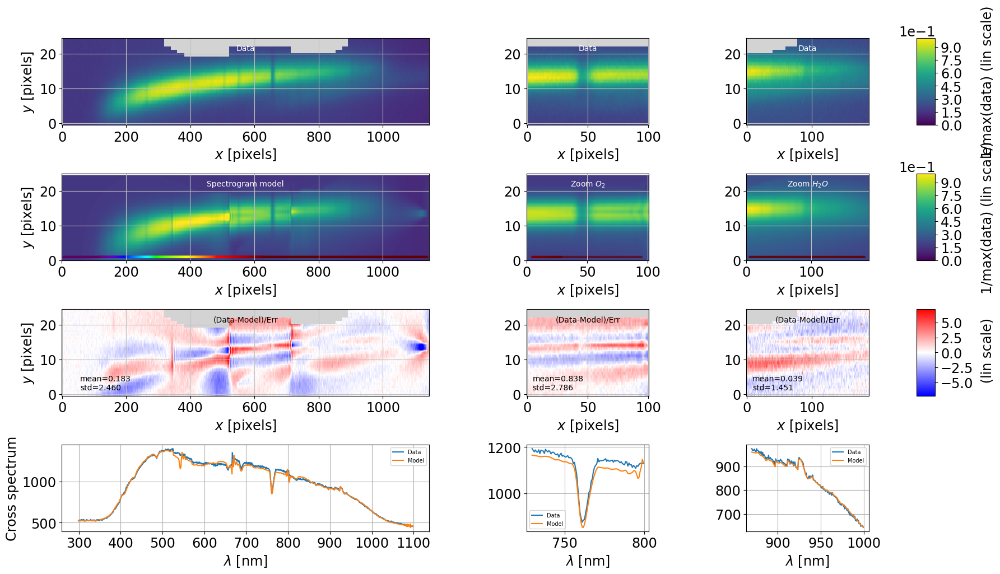

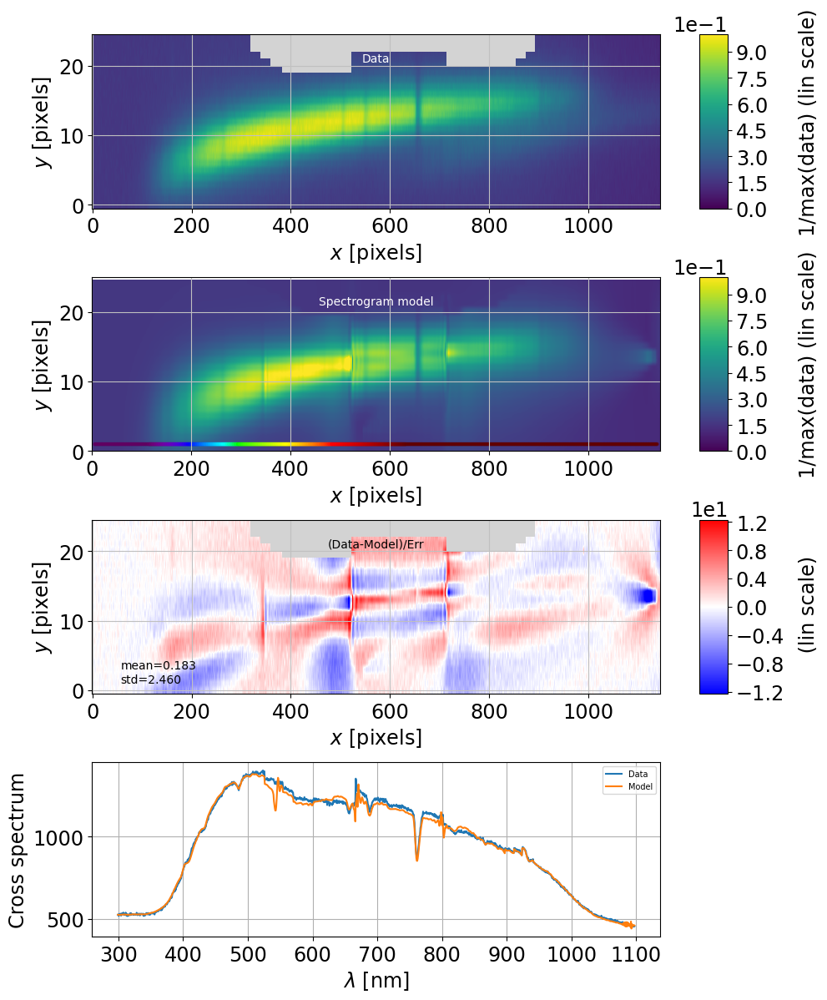

2022-12-09 13:27:05  FullForwardModelFitWorkspace plot_correlation_matrix INFO   Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/parameters_correlation.pdf.


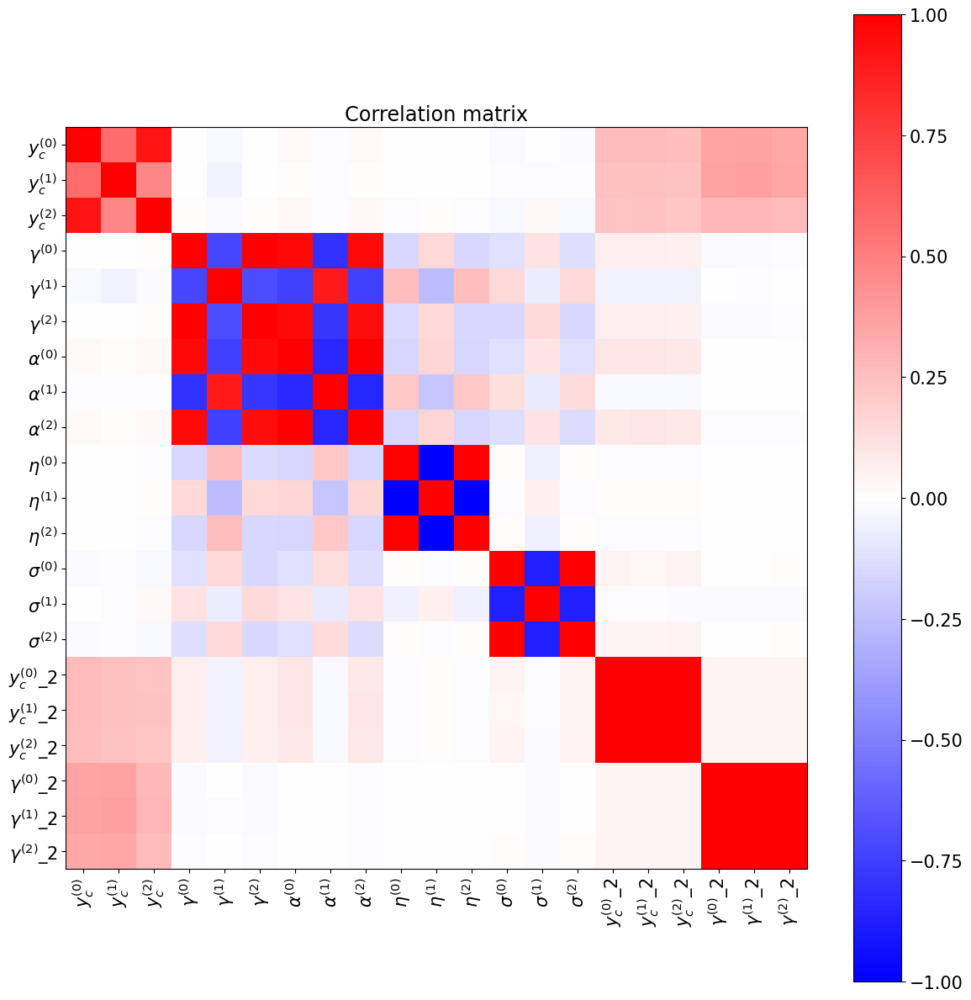

2022-12-09 13:27:06  spectractor.fit.fitter run_minimisation_sigma_clipping INFO   
	No outliers detected at first iteration: break the sigma clipping iterations.
2022-12-09 13:27:06  spectractor.extractor.extractor run_ffm_minimisation INFO   
	  niter = 0 : Newton: total computation time: 1284.910457611084s
2022-12-09 13:27:06  spectractor.extractor.extractor run_ffm_minimisation INFO   
 --- after  run_minimisation_sigma_clipping ---
2022-12-09 13:27:06  spectractor.extractor.extractor dumpfitparameters    INFO   

- fit param #0 :: A2 = 1.0 	 fixed = True 	 bounds 0.000 - 20.000
- fit param #1 :: D_CCD [mm] = 180.0902414871338 	 fixed = True 	 bounds 178.890 - 181.290
- fit param #2 :: shift_x [pix] = 0.18324873500264732 	 fixed = True 	 bounds -5.000 - 5.000
- fit param #3 :: shift_y [pix] = -1.4391037387594428 	 fixed = True 	 bounds -50.000 - 50.000
- fit param #4 :: angle [deg] = 0.13986756501869305 	 fixed = True 	 bounds -90.000 - 90.000
- fit param #5 :: B = 1.0 	 fixed = Tr

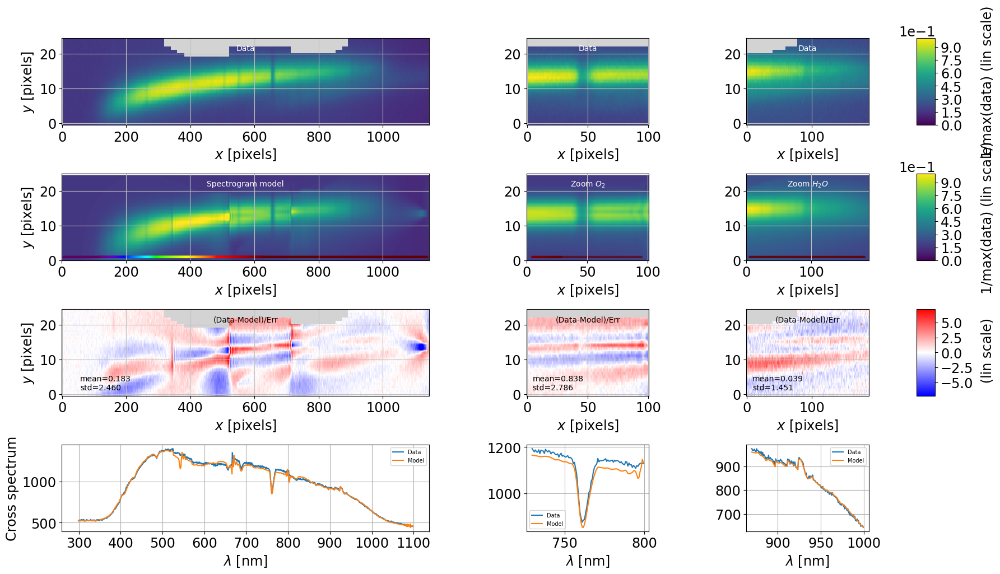

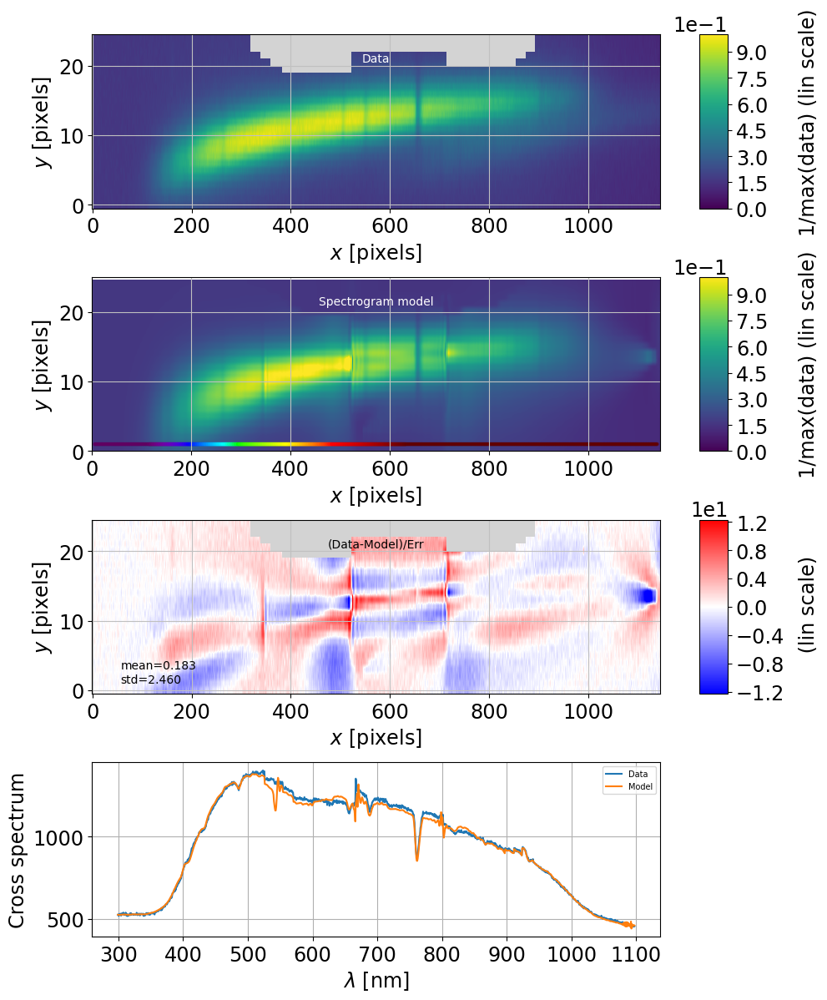

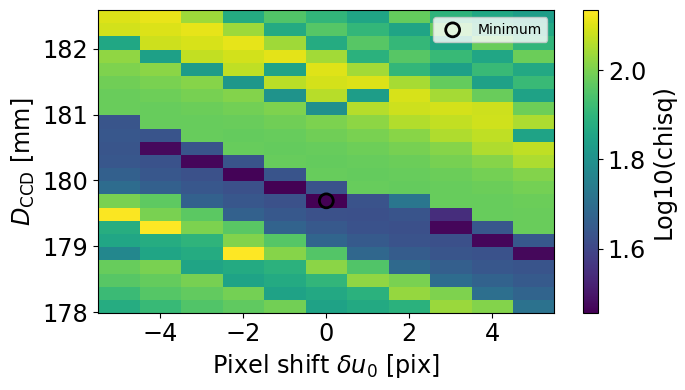

2022-12-09 13:27:31  Spectrum   calibrate_spectrum   INFO   
	Order0 total shift: 0.000pix
	D = 179.687 mm (default: DISTANCE2CCD = 180.00 +/- 0.40 mm, -0.8 sigma shift)
2022-12-09 13:27:31  FullForwardModelFitWorkspace set_mask             INFO   
	Reset spectrogram mask with current parameters.
2022-12-09 13:27:34  spectractor.fit.fitter run_minimisation_sigma_clipping INFO   
	Sigma-clipping step 0/3 (sigma=100)
2022-12-09 13:28:14  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=0: initial cost=1.4917e+05 initial chisq_red=5.9334
		 Line search: alpha_min=1 iter=1 funcalls=5
	Parameter shifts: [-4.23790909e-03  5.40467573e-02  3.74739163e-02 -3.55646821e-01
  5.90864144e-02 -8.98829175e-01 -2.33397476e-01  1.02591532e-02
 -5.01836332e-01 -2.00656309e+00  1.29616784e+00 -4.33183473e+00
  7.12359193e-02 -1.18218672e-01  2.27098205e-01  2.52807325e+00
  4.79725612e+00  2.51298732e+00  4.31780024e+01  7.97752276e+01
  4.26660605e+01]
	New parameters: [-1.07031492e-01 -4.

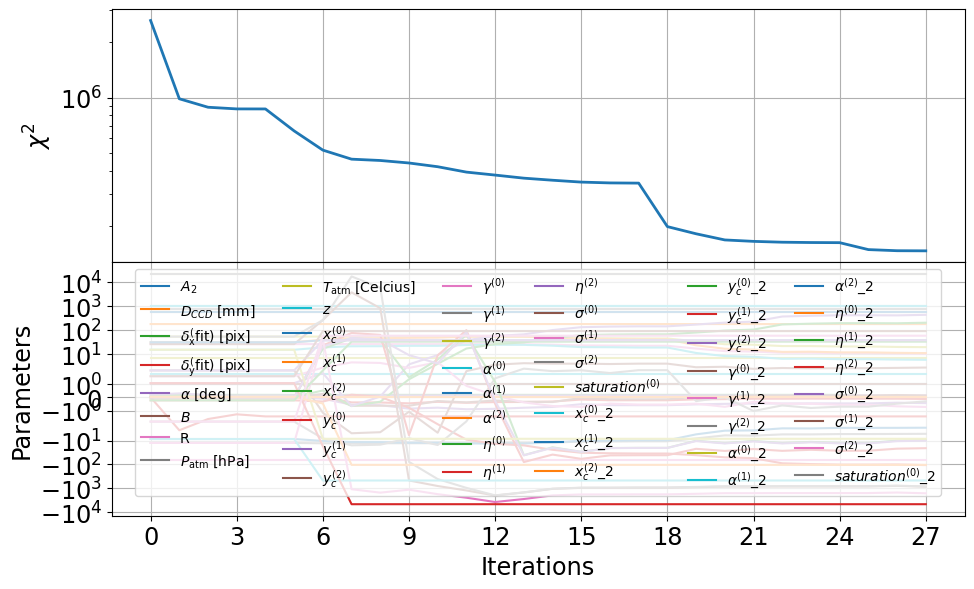

2022-12-09 13:29:02  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/ffm_bestfit.pdf.
2022-12-09 13:29:03  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/ffm_bestfit_2.pdf.


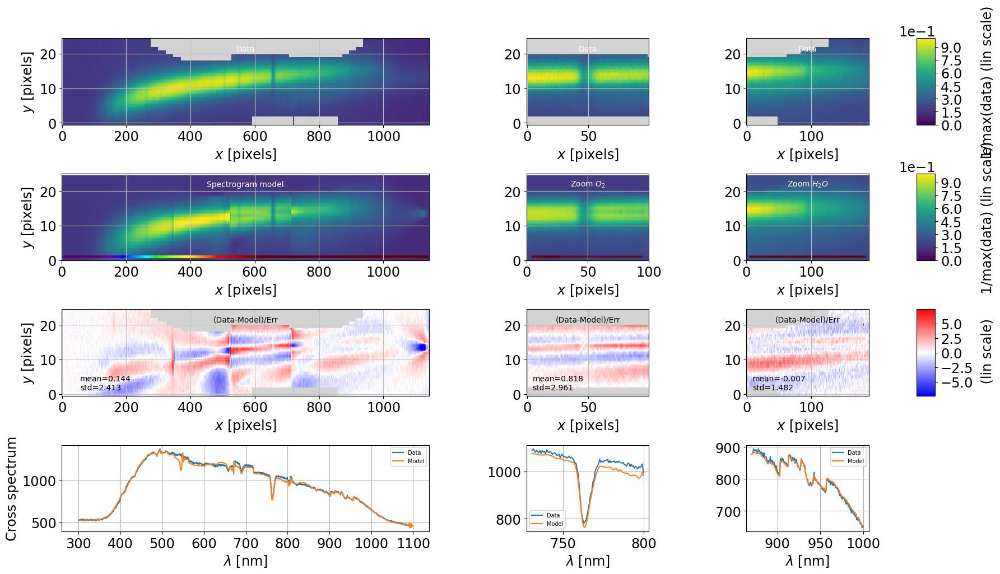

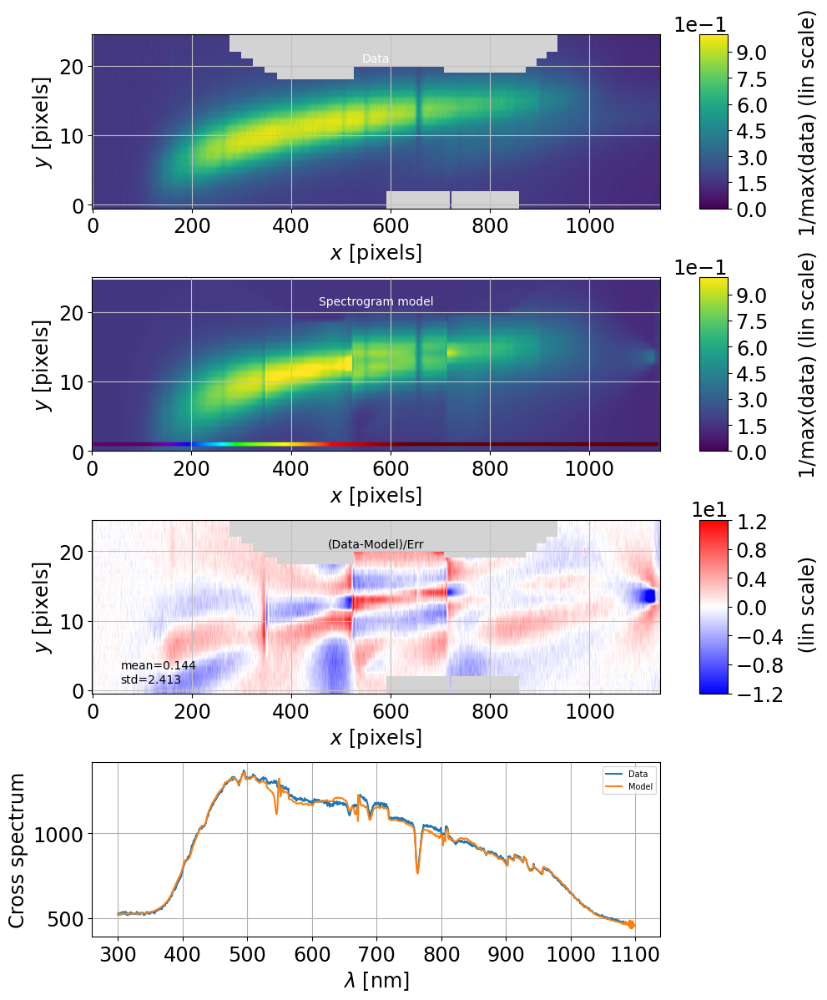

2022-12-09 13:29:06  FullForwardModelFitWorkspace plot_correlation_matrix INFO   Save figure ./figures_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3/parameters_correlation.pdf.


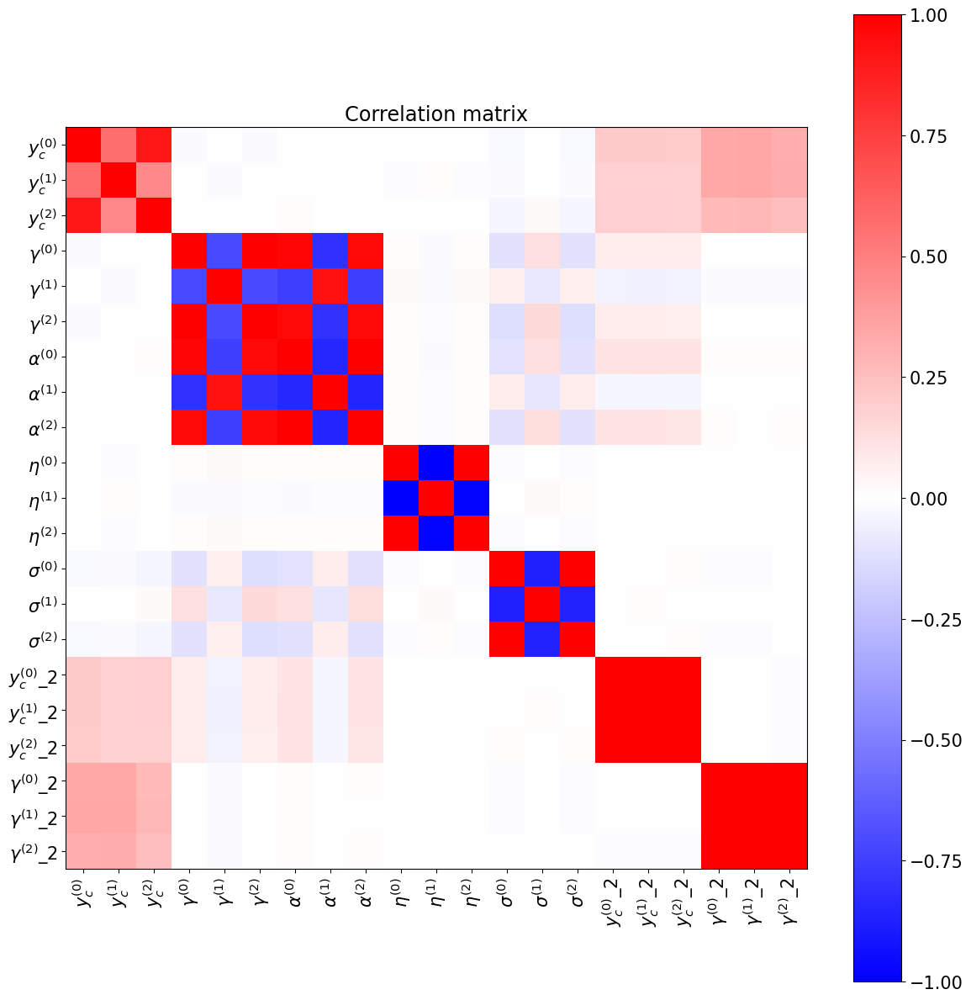

2022-12-09 13:29:07  spectractor.fit.fitter run_minimisation_sigma_clipping INFO   
	No outliers detected at first iteration: break the sigma clipping iterations.
2022-12-09 13:29:07  spectractor.extractor.extractor run_ffm_minimisation INFO   
	  niter = 1 : Newton: total computation time: 1406.5022473335266s
2022-12-09 13:29:07  spectractor.extractor.extractor run_ffm_minimisation INFO   
 --- after  run_minimisation_sigma_clipping ---
2022-12-09 13:29:07  spectractor.extractor.extractor dumpfitparameters    INFO   

- fit param #0 :: A2 = 1.0 	 fixed = True 	 bounds 0.000 - 20.000
- fit param #1 :: D_CCD [mm] = 179.68667978735544 	 fixed = True 	 bounds 178.890 - 181.290
- fit param #2 :: shift_x [pix] = 0.000454939971074134 	 fixed = True 	 bounds -5.000 - 5.000
- fit param #3 :: shift_y [pix] = -1.4391037387594428 	 fixed = True 	 bounds -50.000 - 50.000
- fit param #4 :: angle [deg] = 0.13986756501869305 	 fixed = True 	 bounds -90.000 - 90.000
- fit param #5 :: B = 1.0 	 fixed =

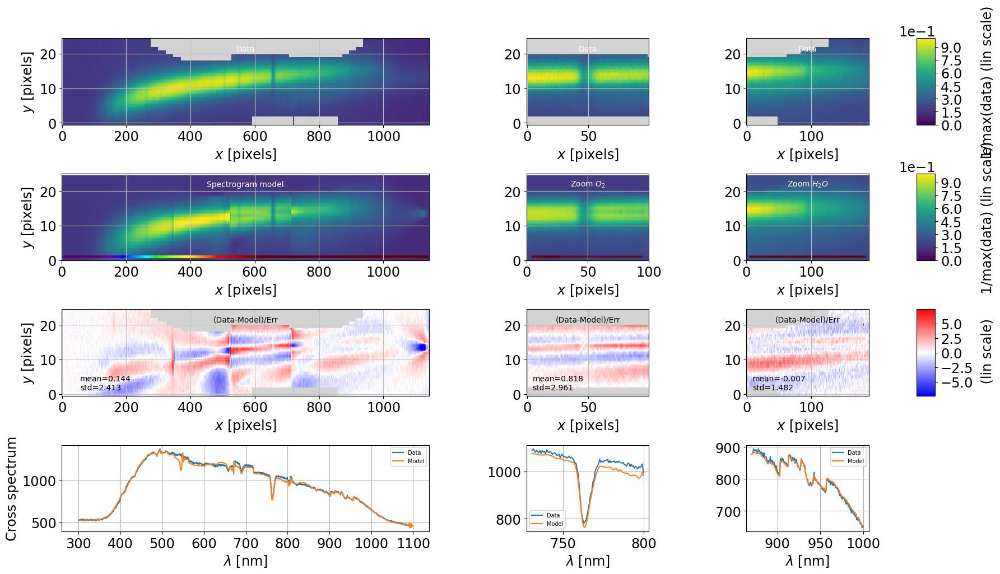

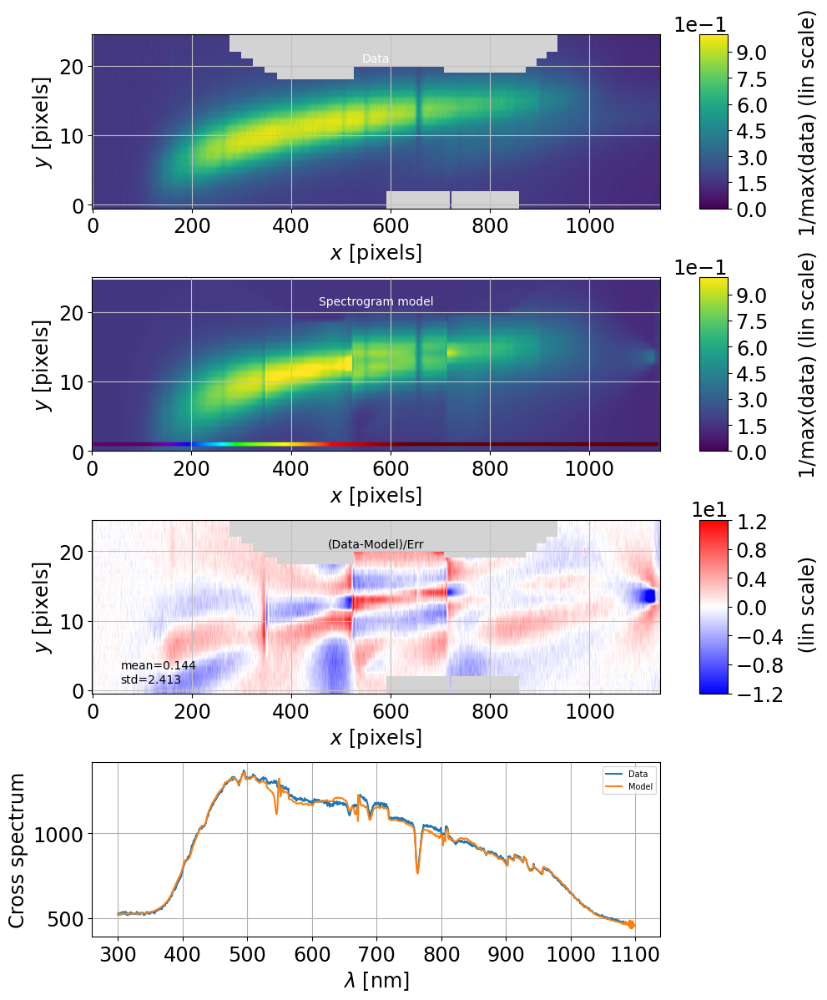

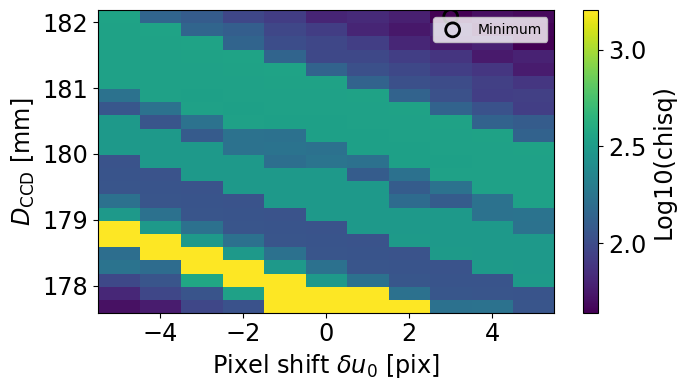

2022-12-09 13:29:31  Spectrum   calibrate_spectrum   INFO   
	Order0 total shift: 2.000pix
	D = 182.334 mm (default: DISTANCE2CCD = 180.00 +/- 0.40 mm, 5.8 sigma shift)
2022-12-09 13:29:31  spectractor.extractor.extractor Spectractor          INFO   
	  ======================= SAVE SPECTRUM =============================
2022-12-09 13:29:32  astroquery _showwarning         WARNING UnitsWarning: 'erg/s/cm$^2$/nm' did not parse as fits unit: Invalid character at col 8 If this is meant to be a custom unit, define it with 'u.def_unit'. To have it recognized inside a file reader or other code, enable it with 'u.add_enabled_units'. For details, see https://docs.astropy.org/en/latest/units/combining_and_defining.html
2022-12-09 13:29:32  astroquery _showwarning         WARNING UnitsWarning: 'reduced' did not parse as fits unit: At col 0, Unit 'reduced' not supported by the FITS standard.  If this is meant to be a custom unit, define it with 'u.def_unit'. To have it recognized inside a file rea

    Line    Tabulated  Detected ...   Chisq   Eqwidth_mod Eqwidth_data
                nm        nm    ...  reduced       nm          nm     
----------- --------- --------- ... --------- ----------- ------------
$H\epsilon$ 397.27274 403.66885 ... 0.5476803   1.2235191    1.4209801
  $H\alpha$ 656.75085  661.0591 ...   60.5141     7.89625    6.5398765
   $O_2(B)$   687.472  693.7296 ...   60.5141    4.376011     7.649166
                760.3 754.73535 ... 3.2785468    3.608021    2.9335387


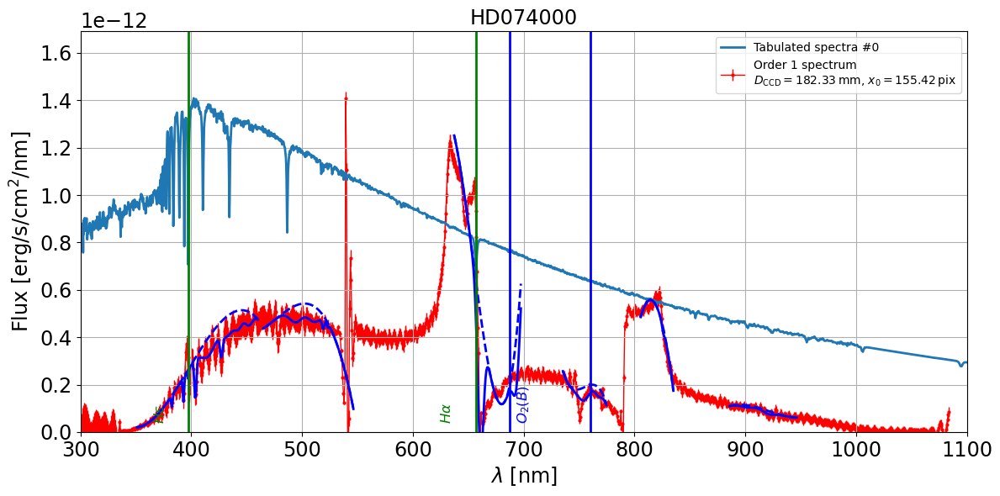

In [88]:
if FLAG_RUNWITHEXCEPTIONS:
    try:
        spectrum = Spectractor(filename, output_directory, guess=[x1,y1], target_label=target_name_sel, disperser_label=disperser_label, config=config)
    except:
        errtype = sys.exc_info()[0]  # E.g. <class 'PermissionError'>
        description = sys.exc_info()[1]   # E.g. [Errno 13] Permission denied: ...
        
        print("\t +++++++++++++++++++++ Exception occured +++++++++++++++++++++++++++++++++++++++++")
        print(f"\t >>>>>  errtype = {errtype}")
        print(f"\t >>>>>> description = {description}")
else:
    spectrum = Spectractor(filename, output_directory, guess=[x1,y1], target_label=target_name_sel, disperser_label=disperser_label, config=config)

    Line    Tabulated  Detected ...   Chisq   Eqwidth_mod Eqwidth_data
                nm        nm    ...  reduced       nm          nm     
----------- --------- --------- ... --------- ----------- ------------
$H\epsilon$ 397.27274 403.66885 ... 0.5476803   1.2235191    1.4209801
  $H\alpha$ 656.75085  661.0591 ...   60.5141     7.89625    6.5398765
   $O_2(B)$   687.472  693.7296 ...   60.5141    4.376011     7.649166
                760.3 754.73535 ... 3.2785468    3.608021    2.9335387


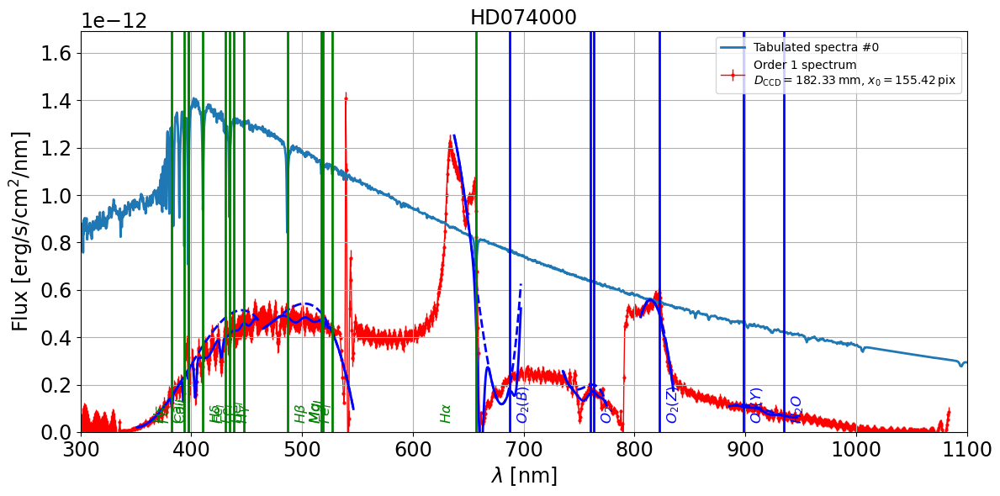

In [89]:
spectrum.plot_spectrum(force_lines=True) 

# Backup output

- If no crash occurs, arrive here

./outputs_process_holo_config_DECONVOLUTION_PSF2D

In [90]:
def cleandir(path):
    if os.path.isdir(path):
        files=os.listdir(path)
        if len(files) > 0:
            for f in files:
                if os.path.isdir(os.path.join(path,f)):
                    if f==".ipynb_checkpoints":
                        shutil.rmtree(os.path.join(path,f))
                    else:
                        print(" Cannot remove this directory {}".format(os.path.join(path,f)))
                else:
                    os.remove(os.path.join(path,f))

In [91]:
# this flag must be set if one want to clean results from previous runs
if FLAG_MANAGE_OUTPUT_SPECTRACTOR:
    
    # manage global output directory of spectractor
    # Basically it has the name of the input file image
    
    if not os.path.isdir(path_toptoptopoutput_spectractor):
        os.mkdir(path_toptoptopoutput_spectractor)
    
    if not os.path.isdir(path_toptopoutput_spectractor):
        os.mkdir(path_toptopoutput_spectractor) 
        
    if configdir !="":
    # top directory    
        if not os.path.isdir(path_topoutput_spectractor):
            os.mkdir(path_topoutput_spectractor)   
            
            
        if not os.path.isdir(path_output_spectractor):
            os.mkdir(path_output_spectractor)
  
    
    if not os.path.isdir(finalpath_output_spectractor):
        os.mkdir(finalpath_output_spectractor)
        os.mkdir(os.path.join(finalpath_output_spectractor,"basespec"))
        os.mkdir(os.path.join(finalpath_output_spectractor,"plots"))
    else:
        cleandir(os.path.join(finalpath_output_spectractor,"basespec"))
        cleandir(os.path.join(finalpath_output_spectractor,"plots"))

In [92]:
print("******************************** SUCCESS ********************************************")

******************************** SUCCESS ********************************************


In [93]:
copy_tree(output_directory,os.path.join(finalpath_output_spectractor,"basespec"))

['/sps/lsst/groups/auxtel/data/2023/OutputSpectractor/postISRCCD/empty~holo4_003/config_DECONVOLUTION_FFMREBIN2vDec2022/20221207/2022120700362/basespec/exposure_2022120700362_postisrccd_spectrum.fits',
 '/sps/lsst/groups/auxtel/data/2023/OutputSpectractor/postISRCCD/empty~holo4_003/config_DECONVOLUTION_FFMREBIN2vDec2022/20221207/2022120700362/basespec/exposure_2022120700362_postisrccd_lines.csv']

In [94]:
copy_tree(output_figures,os.path.join(finalpath_output_spectractor,"plots"))

['/sps/lsst/groups/auxtel/data/2023/OutputSpectractor/postISRCCD/empty~holo4_003/config_DECONVOLUTION_FFMREBIN2vDec2022/20221207/2022120700362/plots/amplitude_correlation_matrix.pdf',
 '/sps/lsst/groups/auxtel/data/2023/OutputSpectractor/postISRCCD/empty~holo4_003/config_DECONVOLUTION_FFMREBIN2vDec2022/20221207/2022120700362/plots/background_extraction.pdf',
 '/sps/lsst/groups/auxtel/data/2023/OutputSpectractor/postISRCCD/empty~holo4_003/config_DECONVOLUTION_FFMREBIN2vDec2022/20221207/2022120700362/plots/regularisation.pdf',
 '/sps/lsst/groups/auxtel/data/2023/OutputSpectractor/postISRCCD/empty~holo4_003/config_DECONVOLUTION_FFMREBIN2vDec2022/20221207/2022120700362/plots/D2CCD_x0_fit.pdf',
 '/sps/lsst/groups/auxtel/data/2023/OutputSpectractor/postISRCCD/empty~holo4_003/config_DECONVOLUTION_FFMREBIN2vDec2022/20221207/2022120700362/plots/intermediate_spectrum.pdf',
 '/sps/lsst/groups/auxtel/data/2023/OutputSpectractor/postISRCCD/empty~holo4_003/config_DECONVOLUTION_FFMREBIN2vDec2022/2022

In [95]:
print("finalpath_output_spectractor = ",finalpath_output_spectractor)

finalpath_output_spectractor =  /sps/lsst/groups/auxtel/data/2023/OutputSpectractor/postISRCCD/empty~holo4_003/config_DECONVOLUTION_FFMREBIN2vDec2022/20221207/2022120700362


In [96]:
os.listdir(os.path.join(finalpath_output_spectractor,"basespec"))

['exposure_2022120700362_postisrccd_lines.csv',
 'exposure_2022120700362_postisrccd_spectrum.fits']

In [97]:
os.listdir(os.path.join(finalpath_output_spectractor,"plots"))

['D2CCD_x0_fit.pdf',
 'rotated_image.pdf',
 'order0_centroid_fit.pdf',
 'ffm_bestfit_2.pdf',
 'fit_chromatic_psf_best_fit_noprior.pdf',
 'sub_image_subtracted.pdf',
 'amplitude_correlation_matrix.pdf',
 'HD074000_spectrum.pdf',
 'image.pdf',
 'regularisation.pdf',
 'fwhm.pdf',
 'ffm_bestfit.pdf',
 'intermediate_spectrum.pdf',
 'background_extraction.pdf',
 'parameters_correlation.pdf']

In [98]:
output_directory

'./outputs_process_20221207_empty~holo4_003_config_DECONVOLUTION_FFMREBIN2vDec2022_nb_3'